# Cleaning, inspecting JSON tracking output

## Goals
- Tracking program outputs JSON files with tracking and tag data
- Need to experiment with cleaning and processing it before integrating it back into the main program

In [13]:
%matplotlib inline
#from pylab import rcParams
#rcParams['figure.figsize'] = 12, 8

%load_ext autoreload
%autoreload 2

%load_ext version_information
%version_information numpy, scipy, matplotlib, pandas

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
The version_information extension is already loaded. To reload it, use:
  %reload_ext version_information


Software versions
Python 2.7.12 64bit [GCC 5.4.0 20160609]
IPython 5.4.1
OS Linux 4.10.0 28 generic x86_64 with Ubuntu 16.04 xenial
numpy 1.13.1
scipy 0.19.1
matplotlib 2.0.2
pandas 0.20.3
Fri Aug 04 09:31:26 2017 AEST

In [14]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import cv2
import pandas as pd

import os
import sys

sys.path.append("../src")

np.random.seed(0)

def view(image):
    plt.figure()
    plt.axis('off')
    plt.imshow(image, cmap = cm.Greys_r)

In [15]:
def read_coordinates_file(coord_file_path):
    file_extension = coord_file_path.split('.')[-1]
    if file_extension == 'csv':
        df = pd.read_csv(coord_file_path)
    elif file_extension == 'json':
        df = pd.read_json(coord_file_path)
    else:
        print('Unknown coordinate file type')
        sys.exit(0)
        
    # turn coordinate column into x,y dictionary
    df['xy'] = df['xy'].apply(lambda x: eval(str(x)))

    return df

In [16]:
df = read_coordinates_file('/home/jack/Data/Caffeine_Unique_Tags/json/2017-02-14_23-32-00.json')
df.head()

,bee_id,classifications,flattened_28x28_tag_matrices,frame_nums,xy
0,0,47,"[29, 31, 33, 35, 36, 36, 36, 43, 48, 51, 56, 6...",0,"{u'y': 1317.45056152, u'x': 1767.85913086}"
1,0,38,"[26, 26, 26, 26, 27, 27, 30, 36, 36, 36, 46, 6...",1,"{u'y': 1314.23205566, u'x': 1770.20056152}"
2,0,38,"[26, 26, 26, 31, 29, 26, 27, 27, 33, 40, 52, 6...",2,"{u'y': 1314.06726074, u'x': 1772.17089844}"
3,0,38,"[19, 20, 22, 25, 25, 28, 35, 39, 45, 50, 52, 5...",3,"{u'y': 1311.36315918, u'x': 1774.7980957}"
4,0,38,"[19, 22, 23, 23, 25, 30, 36, 39, 44, 47, 60, 6...",4,"{u'y': 1314.21838379, u'x': 1776.66015625}"


In [17]:
print(df['xy'][0]['x'])
print(type(df['xy'][0]['x']))

1767.85913086
<type 'float'>


In [18]:
flat_image = df['flattened_28x28_tag_matrices'][0]

print(flat_image)
print(len(flat_image))

[29, 31, 33, 35, 36, 36, 36, 43, 48, 51, 56, 68, 73, 66, 61, 53, 50, 44, 42, 44, 44, 45, 45, 46, 43, 38, 36, 36, 28, 30, 32, 37, 42, 45, 50, 58, 66, 70, 84, 97, 113, 109, 104, 100, 87, 78, 67, 62, 60, 54, 51, 47, 44, 41, 38, 36, 26, 31, 33, 36, 45, 52, 61, 68, 79, 89, 110, 131, 151, 150, 144, 146, 128, 109, 94, 83, 73, 62, 57, 51, 46, 43, 39, 34, 26, 33, 36, 33, 49, 58, 72, 85, 95, 110, 134, 162, 185, 188, 188, 189, 166, 139, 121, 103, 87, 72, 59, 58, 52, 43, 39, 33, 26, 34, 37, 44, 68, 94, 118, 121, 123, 125, 150, 171, 194, 200, 205, 212, 198, 181, 165, 149, 128, 110, 100, 80, 65, 54, 49, 42, 24, 33, 42, 52, 90, 128, 166, 162, 156, 148, 169, 186, 203, 216, 225, 233, 228, 217, 212, 193, 171, 151, 129, 102, 78, 71, 64, 57, 23, 36, 49, 64, 109, 163, 212, 198, 185, 169, 184, 195, 213, 227, 233, 239, 239, 240, 240, 234, 215, 194, 164, 125, 93, 81, 73, 66, 33, 47, 66, 82, 128, 172, 214, 195, 177, 158, 169, 178, 191, 210, 231, 241, 241, 241, 241, 235, 227, 215, 191, 166, 140, 115, 99, 76, 37

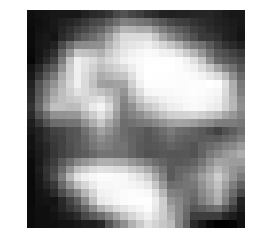

In [19]:
view(np.array(flat_image, dtype=np.uint8).reshape(28, 28))

In [22]:
for i, coord in enumerate(df['xy']):


{u'y': 1317.4505615234, u'x': 1767.8591308594}
{u'y': 1314.2320556641, u'x': 1770.2005615234}
{u'y': 1314.0672607422, u'x': 1772.1708984375}
{u'y': 1311.3631591797, u'x': 1774.7980957031}
{u'y': 1314.2183837891, u'x': 1776.66015625}
{u'y': 1313.6352539062, u'x': 1776.8166503906}
{u'y': 1310.921875, u'x': 1779.0806884766}
{u'y': 1311.4753417969, u'x': 1778.5406494141}
{u'y': 1311.4520263672, u'x': 1778.5343017578}
{u'y': 1313.5988769531, u'x': 1776.3841552734}
{u'y': 1313.1749267578, u'x': 1774.4722900391}
{u'y': 1312.9592285156, u'x': 1773.9172363281}
{u'y': 1312.1518554688, u'x': 1770.6411132812}
{u'y': 1314.0528564453, u'x': 1769.4906005859}
{u'y': 1311.0405273438, u'x': 1767.3160400391}
{u'y': 1306.6597900391, u'x': 1764.2850341797}
{u'y': 1311.1165771484, u'x': 1763.6356201172}
{u'y': 1305.1368408203, u'x': 1762.7766113281}
{u'y': 1303.5430908203, u'x': 1760.7042236328}
{u'y': 1303.4608154297, u'x': 1761.4504394531}
{u'y': 1302.5758056641, u'x': 1759.7156982422}
{u'y': 1301.2241210

{u'y': 1340.5250244141, u'x': 1763.1595458984}
{u'y': 1339.544921875, u'x': 1762.9545898438}
{u'y': 1339.4918212891, u'x': 1763.1020507812}
{u'y': 1340.1148681641, u'x': 1762.5454101562}
{u'y': 1340.9139404297, u'x': 1762.49609375}
{u'y': 1340.7290039062, u'x': 1762.9488525391}
{u'y': 1340.4333496094, u'x': 1763.5319824219}
{u'y': 1340.6751708984, u'x': 1764.2647705078}
{u'y': 1341.6195068359, u'x': 1764.7087402344}
{u'y': 1342.2518310547, u'x': 1771.623046875}
{u'y': 1342.7010498047, u'x': 1775.1330566406}
{u'y': 1343.84375, u'x': 1776.9974365234}
{u'y': 1343.7291259766, u'x': 1779.3188476562}
{u'y': 1342.9031982422, u'x': 1780.7174072266}
{u'y': 1342.8503417969, u'x': 1783.1613769531}
{u'y': 1342.9377441406, u'x': 1783.4110107422}
{u'y': 1342.8239746094, u'x': 1782.8948974609}
{u'y': 1343.9312744141, u'x': 1784.2224121094}
{u'y': 1343.5725097656, u'x': 1783.3837890625}
{u'y': 1343.1604003906, u'x': 1785.4403076172}
{u'y': 1344.2860107422, u'x': 1784.6912841797}
{u'y': 1344.6491699219

{u'y': 1391.2506103516, u'x': 1776.2156982422}
{u'y': 1393.0068359375, u'x': 1775.3063964844}
{u'y': 1393.1646728516, u'x': 1774.5570068359}
{u'y': 1393.3585205078, u'x': 1774.4072265625}
{u'y': 1393.8864746094, u'x': 1773.7917480469}
{u'y': 1393.6804199219, u'x': 1773.9157714844}
{u'y': 1393.4600830078, u'x': 1773.6752929688}
{u'y': 1392.7056884766, u'x': 1774.2711181641}
{u'y': 1391.7989501953, u'x': 1774.9029541016}
{u'y': 1391.5415039062, u'x': 1775.2399902344}
{u'y': 1390.8549804688, u'x': 1775.9312744141}
{u'y': 1390.7340087891, u'x': 1776.0394287109}
{u'y': 1390.5368652344, u'x': 1776.0556640625}
{u'y': 1390.3189697266, u'x': 1776.2858886719}
{u'y': 1389.9873046875, u'x': 1776.4653320312}
{u'y': 1389.9145507812, u'x': 1776.2717285156}
{u'y': 1389.3804931641, u'x': 1777.1049804688}
{u'y': 1389.3286132812, u'x': 1777.2750244141}
{u'y': 1389.3636474609, u'x': 1777.4158935547}
{u'y': 1389.23828125, u'x': 1776.0499267578}
{u'y': 1388.509765625, u'x': 1776.3269042969}
{u'y': 1388.8487

{u'y': 1328.0716552734, u'x': 1881.3918457031}
{u'y': 1328.8156738281, u'x': 1879.4923095703}
{u'y': 1335.1821289062, u'x': 1875.9692382812}
{u'y': 1334.9516601562, u'x': 1875.1606445312}
{u'y': 1333.9001464844, u'x': 1873.5932617188}
{u'y': 1333.7376708984, u'x': 1871.8291015625}
{u'y': 1333.2000732422, u'x': 1871.6730957031}
{u'y': 1333.2879638672, u'x': 1871.5778808594}
{u'y': 1333.3269042969, u'x': 1869.8795166016}
{u'y': 1333.1569824219, u'x': 1869.8341064453}
{u'y': 1333.0360107422, u'x': 1868.2294921875}
{u'y': 1332.5924072266, u'x': 1867.4210205078}
{u'y': 1331.7822265625, u'x': 1867.6440429688}
{u'y': 1331.0125732422, u'x': 1866.9558105469}
{u'y': 1331.0487060547, u'x': 1868.3820800781}
{u'y': 1330.93359375, u'x': 1869.18359375}
{u'y': 1331.5201416016, u'x': 1870.9398193359}
{u'y': 1331.7348632812, u'x': 1870.6999511719}
{u'y': 1331.5223388672, u'x': 1872.5308837891}
{u'y': 1330.8532714844, u'x': 1873.2380371094}
{u'y': 1330.1231689453, u'x': 1872.2705078125}
{u'y': 1329.67968

{u'y': 1330.8908691406, u'x': 1889.1942138672}
{u'y': 1330.9144287109, u'x': 1889.1801757812}
{u'y': 1330.9505615234, u'x': 1889.3686523438}
{u'y': 1330.9182128906, u'x': 1889.8380126953}
{u'y': 1330.8392333984, u'x': 1889.8658447266}
{u'y': 1330.7425537109, u'x': 1889.7562255859}
{u'y': 1330.7734375, u'x': 1889.41796875}
{u'y': 1330.5549316406, u'x': 1889.6452636719}
{u'y': 1330.6887207031, u'x': 1889.5863037109}
{u'y': 1330.8786621094, u'x': 1889.7161865234}
{u'y': 1330.8836669922, u'x': 1890.1199951172}
{u'y': 1330.7886962891, u'x': 1890.2091064453}
{u'y': 1330.7556152344, u'x': 1890.1394042969}
{u'y': 1330.7196044922, u'x': 1889.9842529297}
{u'y': 1331.0048828125, u'x': 1889.9912109375}
{u'y': 1330.6358642578, u'x': 1889.7572021484}
{u'y': 1330.9387207031, u'x': 1889.9450683594}
{u'y': 1331.0223388672, u'x': 1889.8537597656}
{u'y': 1330.8603515625, u'x': 1889.7868652344}
{u'y': 1330.8612060547, u'x': 1889.5944824219}
{u'y': 1330.9853515625, u'x': 1889.7279052734}
{u'y': 1331.034301

{u'y': 1381.1743164062, u'x': 1910.1306152344}
{u'y': 1381.2315673828, u'x': 1910.146484375}
{u'y': 1381.2924804688, u'x': 1910.0465087891}
{u'y': 1381.0421142578, u'x': 1910.1943359375}
{u'y': 1381.0036621094, u'x': 1910.0264892578}
{u'y': 1381.1070556641, u'x': 1910.1246337891}
{u'y': 1381.1267089844, u'x': 1910.2891845703}
{u'y': 1381.1677246094, u'x': 1910.3333740234}
{u'y': 1381.1737060547, u'x': 1910.1455078125}
{u'y': 1381.5783691406, u'x': 1910.3668212891}
{u'y': 1381.5043945312, u'x': 1910.1726074219}
{u'y': 1381.5003662109, u'x': 1910.3425292969}
{u'y': 1381.53125, u'x': 1910.2677001953}
{u'y': 1381.267578125, u'x': 1910.1983642578}
{u'y': 1381.2982177734, u'x': 1910.5554199219}
{u'y': 1381.2641601562, u'x': 1910.3922119141}
{u'y': 1381.3092041016, u'x': 1910.4290771484}
{u'y': 1381.3990478516, u'x': 1910.4992675781}
{u'y': 1381.3520507812, u'x': 1910.3812255859}
{u'y': 1381.3920898438, u'x': 1910.3089599609}
{u'y': 1381.5010986328, u'x': 1910.5196533203}
{u'y': 1381.29138183

{u'y': 1380.6867675781, u'x': 1912.2679443359}
{u'y': 1380.7683105469, u'x': 1912.3504638672}
{u'y': 1380.8958740234, u'x': 1912.1787109375}
{u'y': 1380.9665527344, u'x': 1912.0992431641}
{u'y': 1380.7685546875, u'x': 1911.9998779297}
{u'y': 1380.6993408203, u'x': 1912.3708496094}
{u'y': 1380.34765625, u'x': 1912.5943603516}
{u'y': 1380.0447998047, u'x': 1912.6877441406}
{u'y': 1380.1131591797, u'x': 1912.9934082031}
{u'y': 1380.3071289062, u'x': 1912.5395507812}
{u'y': 1380.4302978516, u'x': 1912.8583984375}
{u'y': 1380.5319824219, u'x': 1912.7846679688}
{u'y': 1380.2772216797, u'x': 1913.1004638672}
{u'y': 1380.4713134766, u'x': 1913.2825927734}
{u'y': 1380.1490478516, u'x': 1913.2229003906}
{u'y': 1380.1059570312, u'x': 1913.4162597656}
{u'y': 1380.2691650391, u'x': 1912.861328125}
{u'y': 1380.1322021484, u'x': 1913.1480712891}
{u'y': 1380.1612548828, u'x': 1913.0858154297}
{u'y': 1380.3598632812, u'x': 1913.0336914062}
{u'y': 1380.0620117188, u'x': 1912.9049072266}
{u'y': 1380.0284

{u'y': 1157.7935791016, u'x': 1889.9520263672}
{u'y': 1155.7155761719, u'x': 1890.3798828125}
{u'y': 1156.7104492188, u'x': 1891.9254150391}
{u'y': 1157.1038818359, u'x': 1891.4995117188}
{u'y': 1157.3249511719, u'x': 1885.4119873047}
{u'y': 1155.5736083984, u'x': 1884.6772460938}
{u'y': 1154.5725097656, u'x': 1883.2537841797}
{u'y': 1153.6928710938, u'x': 1885.6341552734}
{u'y': 1151.5466308594, u'x': 1892.8968505859}
{u'y': 1148.4259033203, u'x': 1894.0659179688}
{u'y': 1146.9691162109, u'x': 1894.8820800781}
{u'y': 1146.2161865234, u'x': 1894.65625}
{u'y': 1146.2569580078, u'x': 1897.0133056641}
{u'y': 1146.8601074219, u'x': 1896.791015625}
{u'y': 1147.7307128906, u'x': 1896.4830322266}
{u'y': 1147.7633056641, u'x': 1895.9410400391}
{u'y': 1146.7478027344, u'x': 1897.6796875}
{u'y': 1146.7612304688, u'x': 1899.0186767578}
{u'y': 1146.7619628906, u'x': 1898.7233886719}
{u'y': 1146.4890136719, u'x': 1898.7150878906}
{u'y': 1146.5447998047, u'x': 1898.9370117188}
{u'y': 1146.1715087891

{u'y': 1149.3979492188, u'x': 1953.1837158203}
{u'y': 1149.3635253906, u'x': 1953.3060302734}
{u'y': 1149.3597412109, u'x': 1952.3399658203}
{u'y': 1149.4685058594, u'x': 1951.88671875}
{u'y': 1151.1215820312, u'x': 1955.2935791016}
{u'y': 1151.6177978516, u'x': 1954.6750488281}
{u'y': 1152.1845703125, u'x': 1948.5344238281}
{u'y': 1153.5278320312, u'x': 1948.044921875}
{u'y': 1152.7712402344, u'x': 1947.5574951172}
{u'y': 1153.3192138672, u'x': 1945.9991455078}
{u'y': 1153.4017333984, u'x': 1940.0257568359}
{u'y': 1152.8234863281, u'x': 1937.5025634766}
{u'y': 1154.2491455078, u'x': 1938.4956054688}
{u'y': 1155.8679199219, u'x': 1940.5225830078}
{u'y': 1157.6280517578, u'x': 1941.7415771484}
{u'y': 1157.8367919922, u'x': 1941.1051025391}
{u'y': 1158.0955810547, u'x': 1940.6071777344}
{u'y': 1157.6048583984, u'x': 1942.2479248047}
{u'y': 1156.0466308594, u'x': 1946.4573974609}
{u'y': 1155.55859375, u'x': 1947.2004394531}
{u'y': 1149.5047607422, u'x': 1949.7427978516}
{u'y': 1147.807495

{u'y': 943.4825439453, u'x': 1306.1263427734}
{u'y': 943.1893920898, u'x': 1306.0836181641}
{u'y': 942.9743041992, u'x': 1305.9482421875}
{u'y': 942.3001098633, u'x': 1304.8110351562}
{u'y': 941.8223876953, u'x': 1303.8125}
{u'y': 940.2687988281, u'x': 1302.6096191406}
{u'y': 940.3702392578, u'x': 1301.5780029297}
{u'y': 941.5829467773, u'x': 1302.6187744141}
{u'y': 945.1606445312, u'x': 1309.5474853516}
{u'y': 946.4538574219, u'x': 1310.7569580078}
{u'y': 946.477355957, u'x': 1312.0036621094}
{u'y': 946.0127563477, u'x': 1310.6165771484}
{u'y': 944.5026855469, u'x': 1306.5153808594}
{u'y': 944.5368652344, u'x': 1306.4559326172}
{u'y': 944.2799682617, u'x': 1302.4619140625}
{u'y': 945.6352539062, u'x': 1300.5747070312}
{u'y': 948.1624755859, u'x': 1298.2844238281}
{u'y': 955.5852050781, u'x': 1296.1137695312}
{u'y': 957.1565551758, u'x': 1294.5174560547}
{u'y': 957.8509521484, u'x': 1293.9760742188}
{u'y': 960.4437255859, u'x': 1294.7663574219}
{u'y': 959.7384643555, u'x': 1291.7359619

{u'y': 1045.4000244141, u'x': 1324.3748779297}
{u'y': 1045.6258544922, u'x': 1324.1873779297}
{u'y': 1045.7366943359, u'x': 1324.2531738281}
{u'y': 1045.7766113281, u'x': 1324.0860595703}
{u'y': 1045.1754150391, u'x': 1323.9099121094}
{u'y': 1045.3316650391, u'x': 1324.9592285156}
{u'y': 1044.826171875, u'x': 1325.1976318359}
{u'y': 1044.8392333984, u'x': 1325.1761474609}
{u'y': 1044.4359130859, u'x': 1325.5345458984}
{u'y': 1044.3115234375, u'x': 1325.3489990234}
{u'y': 1044.7574462891, u'x': 1324.8485107422}
{u'y': 1044.8944091797, u'x': 1324.8333740234}
{u'y': 1045.2875976562, u'x': 1324.1875}
{u'y': 1045.7828369141, u'x': 1323.7877197266}
{u'y': 1046.6048583984, u'x': 1323.3063964844}
{u'y': 1048.6517333984, u'x': 1321.7414550781}
{u'y': 1051.2677001953, u'x': 1320.5526123047}
{u'y': 1052.6408691406, u'x': 1319.5811767578}
{u'y': 1055.6958007812, u'x': 1319.4742431641}
{u'y': 1057.7850341797, u'x': 1320.3449707031}
{u'y': 1060.0809326172, u'x': 1320.7669677734}
{u'y': 1061.59277343

{u'y': 925.0701904297, u'x': 1269.5052490234}
{u'y': 926.2679443359, u'x': 1270.1497802734}
{u'y': 924.3472900391, u'x': 1271.1851806641}
{u'y': 924.893371582, u'x': 1272.1889648438}
{u'y': 924.7009887695, u'x': 1272.4565429688}
{u'y': 924.4271240234, u'x': 1273.1402587891}
{u'y': 924.6141357422, u'x': 1274.1339111328}
{u'y': 924.7770385742, u'x': 1274.6805419922}
{u'y': 924.7641601562, u'x': 1274.0395507812}
{u'y': 924.4248657227, u'x': 1273.7136230469}
{u'y': 923.3031005859, u'x': 1273.3928222656}
{u'y': 922.8698730469, u'x': 1271.8781738281}
{u'y': 922.8803710938, u'x': 1272.5336914062}
{u'y': 921.7959594727, u'x': 1272.1567382812}
{u'y': 921.9890136719, u'x': 1271.1697998047}
{u'y': 922.0160522461, u'x': 1269.5196533203}
{u'y': 922.8173828125, u'x': 1268.5518798828}
{u'y': 922.5355834961, u'x': 1267.7045898438}
{u'y': 922.4703979492, u'x': 1267.2065429688}
{u'y': 922.7816772461, u'x': 1266.1400146484}
{u'y': 922.7823486328, u'x': 1266.4233398438}
{u'y': 922.257019043, u'x': 1266.64

{u'y': 968.0581665039, u'x': 1309.2166748047}
{u'y': 967.2024536133, u'x': 1309.7387695312}
{u'y': 967.0198974609, u'x': 1309.2774658203}
{u'y': 966.9059448242, u'x': 1308.5925292969}
{u'y': 967.2142944336, u'x': 1307.7608642578}
{u'y': 968.7178955078, u'x': 1307.5843505859}
{u'y': 968.4426269531, u'x': 1306.7883300781}
{u'y': 969.8348999023, u'x': 1307.2777099609}
{u'y': 969.9238891602, u'x': 1308.0216064453}
{u'y': 968.9439697266, u'x': 1307.6490478516}
{u'y': 968.1793823242, u'x': 1307.6428222656}
{u'y': 967.6099243164, u'x': 1307.9094238281}
{u'y': 967.3923339844, u'x': 1308.2694091797}
{u'y': 968.9014892578, u'x': 1309.9371337891}
{u'y': 969.9906005859, u'x': 1310.2670898438}
{u'y': 971.5089111328, u'x': 1311.2463378906}
{u'y': 971.3674926758, u'x': 1311.2204589844}
{u'y': 971.9373779297, u'x': 1311.0684814453}
{u'y': 972.4768066406, u'x': 1311.2438964844}
{u'y': 971.9826660156, u'x': 1311.0914306641}
{u'y': 971.7863769531, u'x': 1311.1314697266}
{u'y': 972.4267578125, u'x': 1311.

{u'y': 961.2567138672, u'x': 1470.3056640625}
{u'y': 961.3868408203, u'x': 1470.7027587891}
{u'y': 961.3779296875, u'x': 1470.5997314453}
{u'y': 961.3563842773, u'x': 1470.4841308594}
{u'y': 961.4591064453, u'x': 1470.6945800781}
{u'y': 961.2950439453, u'x': 1470.6936035156}
{u'y': 961.4633789062, u'x': 1470.6531982422}
{u'y': 961.4985961914, u'x': 1471.1147460938}
{u'y': 961.4672241211, u'x': 1471.1141357422}
{u'y': 961.5888671875, u'x': 1471.4489746094}
{u'y': 961.7701416016, u'x': 1471.3708496094}
{u'y': 961.2081298828, u'x': 1472.1911621094}
{u'y': 961.5106811523, u'x': 1472.3961181641}
{u'y': 961.453918457, u'x': 1472.6865234375}
{u'y': 961.4432373047, u'x': 1473.4184570312}
{u'y': 961.7163085938, u'x': 1474.5581054688}
{u'y': 961.6168823242, u'x': 1474.5983886719}
{u'y': 961.6633300781, u'x': 1474.5319824219}
{u'y': 961.7841796875, u'x': 1474.2283935547}
{u'y': 961.2252807617, u'x': 1472.8674316406}
{u'y': 960.6190185547, u'x': 1473.4169921875}
{u'y': 960.272277832, u'x': 1472.83

{u'y': 957.545715332, u'x': 1489.4733886719}
{u'y': 958.0657958984, u'x': 1489.2198486328}
{u'y': 958.3017578125, u'x': 1490.4920654297}
{u'y': 958.809387207, u'x': 1491.794921875}
{u'y': 959.2691040039, u'x': 1492.5407714844}
{u'y': 959.741027832, u'x': 1492.8790283203}
{u'y': 960.1109008789, u'x': 1492.6966552734}
{u'y': 960.5650634766, u'x': 1491.9197998047}
{u'y': 960.5771484375, u'x': 1491.1677246094}
{u'y': 961.4761962891, u'x': 1490.3757324219}
{u'y': 961.6419677734, u'x': 1490.3820800781}
{u'y': 961.2351074219, u'x': 1490.9727783203}
{u'y': 960.7172241211, u'x': 1491.4234619141}
{u'y': 960.1729736328, u'x': 1492.0765380859}
{u'y': 959.8822021484, u'x': 1491.2532958984}
{u'y': 959.9735717773, u'x': 1491.2176513672}
{u'y': 959.5440063477, u'x': 1490.8865966797}
{u'y': 959.885925293, u'x': 1490.7838134766}
{u'y': 959.6478881836, u'x': 1490.3728027344}
{u'y': 959.4193725586, u'x': 1490.5142822266}
{u'y': 959.4758911133, u'x': 1490.7736816406}
{u'y': 959.6983642578, u'x': 1490.70568

{u'y': 905.9963989258, u'x': 1497.9191894531}
{u'y': 905.2525634766, u'x': 1497.9337158203}
{u'y': 904.8380126953, u'x': 1498.3609619141}
{u'y': 903.3326416016, u'x': 1498.6749267578}
{u'y': 903.321105957, u'x': 1498.8880615234}
{u'y': 902.950378418, u'x': 1499.0229492188}
{u'y': 903.0611572266, u'x': 1499.9962158203}
{u'y': 901.4901123047, u'x': 1501.3959960938}
{u'y': 901.0546875, u'x': 1501.4537353516}
{u'y': 900.8168945312, u'x': 1501.4359130859}
{u'y': 900.8012695312, u'x': 1502.8588867188}
{u'y': 901.0114746094, u'x': 1503.9985351562}
{u'y': 900.4599609375, u'x': 1503.1037597656}
{u'y': 900.8731079102, u'x': 1502.4735107422}
{u'y': 900.7122192383, u'x': 1502.1215820312}
{u'y': 901.0298461914, u'x': 1501.3731689453}
{u'y': 900.978515625, u'x': 1500.9189453125}
{u'y': 901.1481933594, u'x': 1500.0533447266}
{u'y': 900.9790649414, u'x': 1499.5086669922}
{u'y': 901.7191772461, u'x': 1500.0657958984}
{u'y': 901.2626342773, u'x': 1499.5717773438}
{u'y': 902.1866455078, u'x': 1499.380126

{u'y': 930.7183837891, u'x': 1412.9989013672}
{u'y': 930.6385498047, u'x': 1412.8026123047}
{u'y': 930.7500610352, u'x': 1412.826171875}
{u'y': 930.5482788086, u'x': 1412.7517089844}
{u'y': 930.1567993164, u'x': 1412.7237548828}
{u'y': 930.3780517578, u'x': 1412.9248046875}
{u'y': 930.212890625, u'x': 1413.0205078125}
{u'y': 930.2362060547, u'x': 1413.0758056641}
{u'y': 930.0673828125, u'x': 1413.1755371094}
{u'y': 929.7108764648, u'x': 1412.9493408203}
{u'y': 929.5974731445, u'x': 1413.1632080078}
{u'y': 929.8865966797, u'x': 1413.0949707031}
{u'y': 929.5668334961, u'x': 1413.5787353516}
{u'y': 929.4664916992, u'x': 1413.5633544922}
{u'y': 929.5745849609, u'x': 1413.4588623047}
{u'y': 929.6657104492, u'x': 1413.2303466797}
{u'y': 929.8612670898, u'x': 1413.3432617188}
{u'y': 929.8617553711, u'x': 1413.4111328125}
{u'y': 929.1925048828, u'x': 1413.2442626953}
{u'y': 929.5153198242, u'x': 1413.3659667969}
{u'y': 929.0759887695, u'x': 1413.2315673828}
{u'y': 928.7943115234, u'x': 1413.25

{u'y': 1129.7353515625, u'x': 1380.3892822266}
{u'y': 1129.556640625, u'x': 1379.9440917969}
{u'y': 1130.1450195312, u'x': 1378.6727294922}
{u'y': 1129.7049560547, u'x': 1378.1739501953}
{u'y': 1129.9996337891, u'x': 1377.3990478516}
{u'y': 1129.7276611328, u'x': 1378.099609375}
{u'y': 1129.7066650391, u'x': 1376.712890625}
{u'y': 1129.5336914062, u'x': 1378.0506591797}
{u'y': 1129.3247070312, u'x': 1376.4533691406}
{u'y': 1129.2513427734, u'x': 1376.2739257812}
{u'y': 1128.9541015625, u'x': 1374.38671875}
{u'y': 1129.3719482422, u'x': 1374.5769042969}
{u'y': 1130.1486816406, u'x': 1374.7769775391}
{u'y': 1130.4643554688, u'x': 1375.1079101562}
{u'y': 1130.6398925781, u'x': 1375.4711914062}
{u'y': 1131.1373291016, u'x': 1375.3371582031}
{u'y': 1130.6867675781, u'x': 1374.8275146484}
{u'y': 1130.7248535156, u'x': 1374.6921386719}
{u'y': 1130.4263916016, u'x': 1375.0494384766}
{u'y': 1130.64453125, u'x': 1375.3450927734}
{u'y': 1130.1737060547, u'x': 1375.6317138672}
{u'y': 1129.87109375

{u'y': 814.6093139648, u'x': 1536.3002929688}
{u'y': 815.3798828125, u'x': 1535.7287597656}
{u'y': 815.2672729492, u'x': 1535.8699951172}
{u'y': 815.8225097656, u'x': 1535.9542236328}
{u'y': 815.6350708008, u'x': 1535.9080810547}
{u'y': 816.0760498047, u'x': 1536.5823974609}
{u'y': 816.6475830078, u'x': 1537.0714111328}
{u'y': 816.7340698242, u'x': 1536.9351806641}
{u'y': 816.7004394531, u'x': 1538.435546875}
{u'y': 816.4323120117, u'x': 1538.8344726562}
{u'y': 815.9469604492, u'x': 1539.7341308594}
{u'y': 815.6278686523, u'x': 1540.0158691406}
{u'y': 815.4623413086, u'x': 1539.7446289062}
{u'y': 815.676574707, u'x': 1540.4860839844}
{u'y': 816.6370849609, u'x': 1541.83203125}
{u'y': 816.5354614258, u'x': 1541.8861083984}
{u'y': 816.4979858398, u'x': 1541.7741699219}
{u'y': 816.7014160156, u'x': 1542.6951904297}
{u'y': 816.7259521484, u'x': 1542.6520996094}
{u'y': 816.8540649414, u'x': 1542.3039550781}
{u'y': 816.3269042969, u'x': 1541.8555908203}
{u'y': 815.9650268555, u'x': 1542.0743

{u'y': 597.4772338867, u'x': 1373.2692871094}
{u'y': 599.0165405273, u'x': 1370.3092041016}
{u'y': 600.069519043, u'x': 1370.0311279297}
{u'y': 602.0567016602, u'x': 1367.8947753906}
{u'y': 603.3420410156, u'x': 1366.6030273438}
{u'y': 605.1187133789, u'x': 1366.9536132812}
{u'y': 607.2990722656, u'x': 1365.3459472656}
{u'y': 606.2610473633, u'x': 1365.0412597656}
{u'y': 604.783996582, u'x': 1365.2567138672}
{u'y': 597.2390136719, u'x': 1364.0048828125}
{u'y': 595.0327758789, u'x': 1361.7569580078}
{u'y': 604.2933349609, u'x': 1351.7175292969}
{u'y': 611.9315795898, u'x': 1354.6300048828}
{u'y': 613.7263793945, u'x': 1357.4927978516}
{u'y': 610.99609375, u'x': 1357.7103271484}
{u'y': 609.2221069336, u'x': 1357.9237060547}
{u'y': 605.4373168945, u'x': 1349.2756347656}
{u'y': 601.7873535156, u'x': 1346.8756103516}
{u'y': 603.5474243164, u'x': 1345.9312744141}
{u'y': 603.6174316406, u'x': 1345.5261230469}
{u'y': 607.5458984375, u'x': 1345.4281005859}
{u'y': 607.3447265625, u'x': 1346.5823

{u'y': 596.6511230469, u'x': 1414.5500488281}
{u'y': 596.7312011719, u'x': 1414.4702148438}
{u'y': 596.5535888672, u'x': 1414.0637207031}
{u'y': 596.6770019531, u'x': 1414.6746826172}
{u'y': 596.8037109375, u'x': 1414.3103027344}
{u'y': 597.042175293, u'x': 1414.0942382812}
{u'y': 596.5805053711, u'x': 1414.3291015625}
{u'y': 596.9111938477, u'x': 1414.0280761719}
{u'y': 597.0000610352, u'x': 1414.2634277344}
{u'y': 597.0425415039, u'x': 1414.57421875}
{u'y': 597.2238769531, u'x': 1414.4078369141}
{u'y': 597.3698120117, u'x': 1414.0687255859}
{u'y': 597.2819824219, u'x': 1414.1414794922}
{u'y': 597.3662109375, u'x': 1414.345703125}
{u'y': 597.3274536133, u'x': 1414.1254882812}
{u'y': 597.4202270508, u'x': 1414.2076416016}
{u'y': 597.325378418, u'x': 1413.8441162109}
{u'y': 597.3948364258, u'x': 1414.4367675781}
{u'y': 597.331237793, u'x': 1413.9899902344}
{u'y': 597.3851318359, u'x': 1414.1614990234}
{u'y': 597.3999633789, u'x': 1413.7921142578}
{u'y': 597.2548828125, u'x': 1414.088500

{u'y': 680.6546630859, u'x': 1434.1807861328}
{u'y': 680.8867797852, u'x': 1434.1313476562}
{u'y': 680.8173828125, u'x': 1434.2109375}
{u'y': 680.9286499023, u'x': 1434.1279296875}
{u'y': 680.9594726562, u'x': 1434.224609375}
{u'y': 680.8268432617, u'x': 1433.7939453125}
{u'y': 680.7802734375, u'x': 1433.8182373047}
{u'y': 680.538269043, u'x': 1433.6892089844}
{u'y': 680.7456665039, u'x': 1433.5244140625}
{u'y': 680.7440185547, u'x': 1433.8951416016}
{u'y': 681.0747070312, u'x': 1433.9272460938}
{u'y': 680.9456787109, u'x': 1433.5943603516}
{u'y': 680.8497924805, u'x': 1433.4130859375}
{u'y': 681.0228881836, u'x': 1433.2924804688}
{u'y': 680.846496582, u'x': 1433.3825683594}
{u'y': 680.8877563477, u'x': 1433.5498046875}
{u'y': 681.044921875, u'x': 1433.9108886719}
{u'y': 681.1650390625, u'x': 1434.2309570312}
{u'y': 681.1387329102, u'x': 1434.1502685547}
{u'y': 681.0595092773, u'x': 1434.3978271484}
{u'y': 681.2130126953, u'x': 1434.1011962891}
{u'y': 680.9610595703, u'x': 1434.3947753

{u'y': 707.1248779297, u'x': 1260.1676025391}
{u'y': 707.3927612305, u'x': 1260.5661621094}
{u'y': 707.3881835938, u'x': 1260.6785888672}
{u'y': 707.6188354492, u'x': 1261.2266845703}
{u'y': 707.245300293, u'x': 1260.9405517578}
{u'y': 707.4239501953, u'x': 1260.1273193359}
{u'y': 707.4885864258, u'x': 1259.99609375}
{u'y': 707.5237426758, u'x': 1258.9526367188}
{u'y': 707.1884765625, u'x': 1258.4641113281}
{u'y': 707.0631103516, u'x': 1258.6235351562}
{u'y': 706.8889160156, u'x': 1260.07421875}
{u'y': 706.6018066406, u'x': 1260.8216552734}
{u'y': 708.1727905273, u'x': 1264.8853759766}
{u'y': 708.4593505859, u'x': 1263.1163330078}
{u'y': 708.6866455078, u'x': 1262.5828857422}
{u'y': 707.7783813477, u'x': 1262.1143798828}
{u'y': 707.8102416992, u'x': 1260.3491210938}
{u'y': 707.854309082, u'x': 1260.3726806641}
{u'y': 709.3612060547, u'x': 1259.65234375}
{u'y': 709.1059570312, u'x': 1258.89453125}
{u'y': 705.2440185547, u'x': 1270.1309814453}
{u'y': 707.4672851562, u'x': 1266.2941894531

{u'y': 1044.2644042969, u'x': 2024.9548339844}
{u'y': 1044.0078125, u'x': 2020.6752929688}
{u'y': 1041.7166748047, u'x': 2017.5667724609}
{u'y': 1037.4361572266, u'x': 2016.3510742188}
{u'y': 1034.0601806641, u'x': 2016.3356933594}
{u'y': 1035.1173095703, u'x': 2013.7530517578}
{u'y': 1035.3653564453, u'x': 2013.3919677734}
{u'y': 1034.9931640625, u'x': 2013.6275634766}
{u'y': 1036.2717285156, u'x': 2015.4298095703}
{u'y': 1036.6586914062, u'x': 2019.2492675781}
{u'y': 1035.5590820312, u'x': 2019.2191162109}
{u'y': 1036.0738525391, u'x': 2017.1384277344}
{u'y': 1037.4130859375, u'x': 2016.3250732422}
{u'y': 1037.5168457031, u'x': 2015.279296875}
{u'y': 1041.1558837891, u'x': 2015.5341796875}
{u'y': 1043.6657714844, u'x': 2013.5720214844}
{u'y': 1042.6793212891, u'x': 2016.2639160156}
{u'y': 1042.2725830078, u'x': 2017.8846435547}
{u'y': 1041.8872070312, u'x': 2018.3466796875}
{u'y': 1047.1171875, u'x': 2013.0029296875}
{u'y': 1048.1480712891, u'x': 2018.9565429688}
{u'y': 1048.16259765

{u'y': 634.6019287109, u'x': 1549.4669189453}
{u'y': 632.565246582, u'x': 1551.6212158203}
{u'y': 633.7941894531, u'x': 1549.2009277344}
{u'y': 637.2138061523, u'x': 1547.7214355469}
{u'y': 642.0606079102, u'x': 1545.1864013672}
{u'y': 641.1010742188, u'x': 1547.2788085938}
{u'y': 641.104675293, u'x': 1548.1512451172}
{u'y': 640.6678466797, u'x': 1548.9405517578}
{u'y': 641.141418457, u'x': 1548.4487304688}
{u'y': 641.6923217773, u'x': 1549.0217285156}
{u'y': 640.7063598633, u'x': 1550.2625732422}
{u'y': 640.8795166016, u'x': 1549.0129394531}
{u'y': 641.8334960938, u'x': 1548.9539794922}
{u'y': 642.0606689453, u'x': 1549.7487792969}
{u'y': 638.3238525391, u'x': 1549.7469482422}
{u'y': 634.9483032227, u'x': 1550.6046142578}
{u'y': 632.0166015625, u'x': 1552.1734619141}
{u'y': 630.2348632812, u'x': 1553.0926513672}
{u'y': 622.7520141602, u'x': 1555.5684814453}
{u'y': 618.798828125, u'x': 1556.9106445312}
{u'y': 614.5646972656, u'x': 1559.4195556641}
{u'y': 619.6365966797, u'x': 1554.3023

{u'y': 1028.5812988281, u'x': 1449.6080322266}
{u'y': 1028.4088134766, u'x': 1449.4720458984}
{u'y': 1028.5404052734, u'x': 1450.3404541016}
{u'y': 1029.0283203125, u'x': 1451.3931884766}
{u'y': 1029.2830810547, u'x': 1451.6038818359}
{u'y': 1028.9505615234, u'x': 1451.5096435547}
{u'y': 1028.8876953125, u'x': 1451.7177734375}
{u'y': 1030.1131591797, u'x': 1452.0942382812}
{u'y': 1030.2622070312, u'x': 1453.2653808594}
{u'y': 1029.6418457031, u'x': 1453.3400878906}
{u'y': 1029.3952636719, u'x': 1453.8894042969}
{u'y': 1029.3811035156, u'x': 1454.8212890625}
{u'y': 1029.1657714844, u'x': 1454.6905517578}
{u'y': 1029.3520507812, u'x': 1454.7083740234}
{u'y': 1029.1107177734, u'x': 1454.6818847656}
{u'y': 1028.7076416016, u'x': 1455.0673828125}
{u'y': 1028.8107910156, u'x': 1454.8099365234}
{u'y': 1029.2080078125, u'x': 1454.2952880859}
{u'y': 1029.5748291016, u'x': 1452.9150390625}
{u'y': 1028.6374511719, u'x': 1452.5289306641}
{u'y': 1028.525390625, u'x': 1452.5687255859}
{u'y': 1028.79

{u'y': 1024.4080810547, u'x': 1399.873046875}
{u'y': 1025.1430664062, u'x': 1400.1640625}
{u'y': 1025.6566162109, u'x': 1400.3883056641}
{u'y': 1025.5728759766, u'x': 1400.1212158203}
{u'y': 1025.7717285156, u'x': 1400.1593017578}
{u'y': 1025.6107177734, u'x': 1399.7838134766}
{u'y': 1025.1228027344, u'x': 1399.4379882812}
{u'y': 1025.6383056641, u'x': 1399.2374267578}
{u'y': 1026.6325683594, u'x': 1399.7756347656}
{u'y': 1026.9875488281, u'x': 1399.3331298828}
{u'y': 1026.6058349609, u'x': 1399.3247070312}
{u'y': 1025.5965576172, u'x': 1398.8327636719}
{u'y': 1026.1043701172, u'x': 1399.3079833984}
{u'y': 1026.6414794922, u'x': 1399.3753662109}
{u'y': 1027.3483886719, u'x': 1399.4119873047}
{u'y': 1027.62109375, u'x': 1399.1958007812}
{u'y': 1027.9581298828, u'x': 1399.4429931641}
{u'y': 1029.3389892578, u'x': 1400.0445556641}
{u'y': 1029.9182128906, u'x': 1399.4144287109}
{u'y': 1030.0225830078, u'x': 1398.8636474609}
{u'y': 1030.5953369141, u'x': 1399.6789550781}
{u'y': 1031.2321777

{u'y': 867.5497436523, u'x': 1332.9727783203}
{u'y': 867.1563110352, u'x': 1334.3879394531}
{u'y': 866.6745605469, u'x': 1334.021484375}
{u'y': 864.2493286133, u'x': 1333.9387207031}
{u'y': 863.6116333008, u'x': 1334.638671875}
{u'y': 863.1541137695, u'x': 1333.6395263672}
{u'y': 861.971496582, u'x': 1334.3640136719}
{u'y': 862.0666503906, u'x': 1332.7155761719}
{u'y': 862.5255126953, u'x': 1331.4868164062}
{u'y': 862.8000488281, u'x': 1329.9177246094}
{u'y': 863.4027099609, u'x': 1329.5257568359}
{u'y': 864.8302612305, u'x': 1330.8178710938}
{u'y': 865.212890625, u'x': 1331.724609375}
{u'y': 865.1139526367, u'x': 1331.6713867188}
{u'y': 866.4487915039, u'x': 1332.1993408203}
{u'y': 869.3696899414, u'x': 1335.0964355469}
{u'y': 869.9744262695, u'x': 1336.5584716797}
{u'y': 870.5051269531, u'x': 1337.6556396484}
{u'y': 871.2899780273, u'x': 1338.1063232422}
{u'y': 869.7282714844, u'x': 1336.6907958984}
{u'y': 869.9538574219, u'x': 1336.5168457031}
{u'y': 869.0862426758, u'x': 1335.86267

{u'y': 616.2537841797, u'x': 1461.3345947266}
{u'y': 616.2746582031, u'x': 1463.1480712891}
{u'y': 617.4005126953, u'x': 1465.7452392578}
{u'y': 618.6913452148, u'x': 1470.6046142578}
{u'y': 618.3148193359, u'x': 1465.7215576172}
{u'y': 615.2428588867, u'x': 1459.6033935547}
{u'y': 613.0681152344, u'x': 1459.2668457031}
{u'y': 611.6555175781, u'x': 1457.7104492188}
{u'y': 611.8130493164, u'x': 1458.3024902344}
{u'y': 618.1353759766, u'x': 1461.3745117188}
{u'y': 614.2475585938, u'x': 1459.9981689453}
{u'y': 613.6043701172, u'x': 1459.2796630859}
{u'y': 612.735534668, u'x': 1459.4858398438}
{u'y': 611.4748535156, u'x': 1461.0871582031}
{u'y': 609.8442382812, u'x': 1459.4877929688}
{u'y': 610.0152587891, u'x': 1458.2196044922}
{u'y': 610.4320678711, u'x': 1458.2630615234}
{u'y': 614.7095947266, u'x': 1461.0554199219}
{u'y': 610.4154663086, u'x': 1462.3635253906}
{u'y': 608.8350830078, u'x': 1463.6890869141}
{u'y': 608.1491088867, u'x': 1463.2944335938}
{u'y': 607.36328125, u'x': 1461.728

{u'y': 908.8750610352, u'x': 1381.6396484375}
{u'y': 908.670715332, u'x': 1381.4114990234}
{u'y': 909.2980957031, u'x': 1380.8276367188}
{u'y': 909.1438598633, u'x': 1380.6939697266}
{u'y': 909.1461791992, u'x': 1381.5206298828}
{u'y': 909.2541503906, u'x': 1381.8109130859}
{u'y': 909.2299804688, u'x': 1381.8203125}
{u'y': 909.2846069336, u'x': 1381.3428955078}
{u'y': 909.403137207, u'x': 1382.5148925781}
{u'y': 909.4789428711, u'x': 1382.5404052734}
{u'y': 909.4084472656, u'x': 1382.2087402344}
{u'y': 909.4622802734, u'x': 1382.6838378906}
{u'y': 909.1597900391, u'x': 1382.5169677734}
{u'y': 908.7224731445, u'x': 1381.0694580078}
{u'y': 909.0079956055, u'x': 1380.5346679688}
{u'y': 908.9309692383, u'x': 1380.1832275391}
{u'y': 909.0864868164, u'x': 1379.6691894531}
{u'y': 908.7931518555, u'x': 1379.2542724609}
{u'y': 908.8458251953, u'x': 1378.3045654297}
{u'y': 908.6192016602, u'x': 1378.3021240234}
{u'y': 908.9345703125, u'x': 1378.3334960938}
{u'y': 909.2868652344, u'x': 1378.79138

{u'y': 770.220703125, u'x': 1231.9495849609}
{u'y': 770.12109375, u'x': 1231.6994628906}
{u'y': 770.2342529297, u'x': 1226.9420166016}
{u'y': 772.4047241211, u'x': 1224.0217285156}
{u'y': 773.3736572266, u'x': 1222.0445556641}
{u'y': 773.9616699219, u'x': 1221.2916259766}
{u'y': 775.3985595703, u'x': 1220.2175292969}
{u'y': 776.2708740234, u'x': 1219.9676513672}
{u'y': 777.8540039062, u'x': 1220.095703125}
{u'y': 777.6604614258, u'x': 1220.1649169922}
{u'y': 774.43359375, u'x': 1224.5357666016}
{u'y': 773.1134643555, u'x': 1225.6846923828}
{u'y': 771.742980957, u'x': 1226.9791259766}
{u'y': 770.9576416016, u'x': 1227.9666748047}
{u'y': 769.1563110352, u'x': 1232.0446777344}
{u'y': 768.8961181641, u'x': 1233.6057128906}
{u'y': 768.76171875, u'x': 1233.6260986328}
{u'y': 767.8989257812, u'x': 1234.98828125}
{u'y': 765.9475097656, u'x': 1235.9403076172}
{u'y': 764.3454589844, u'x': 1237.7690429688}
{u'y': 764.1694335938, u'x': 1239.1558837891}
{u'y': 764.196105957, u'x': 1240.0335693359}


{u'y': 696.8486938477, u'x': 1485.0159912109}
{u'y': 697.2059936523, u'x': 1484.3817138672}
{u'y': 697.2196655273, u'x': 1484.2430419922}
{u'y': 697.0448608398, u'x': 1484.4196777344}
{u'y': 697.3202514648, u'x': 1482.8220214844}
{u'y': 697.3179931641, u'x': 1482.7465820312}
{u'y': 697.2315673828, u'x': 1482.1883544922}
{u'y': 697.3557128906, u'x': 1481.73828125}
{u'y': 697.8762207031, u'x': 1481.0721435547}
{u'y': 697.4327392578, u'x': 1481.2213134766}
{u'y': 697.3491821289, u'x': 1480.3598632812}
{u'y': 697.9408569336, u'x': 1480.0046386719}
{u'y': 697.9949951172, u'x': 1479.4887695312}
{u'y': 698.4513549805, u'x': 1478.7614746094}
{u'y': 698.2141723633, u'x': 1478.1688232422}
{u'y': 697.7679443359, u'x': 1476.9952392578}
{u'y': 697.2767333984, u'x': 1476.9365234375}
{u'y': 697.2223510742, u'x': 1477.6711425781}
{u'y': 696.6409301758, u'x': 1479.4945068359}
{u'y': 696.6917724609, u'x': 1479.4606933594}
{u'y': 696.1195678711, u'x': 1479.3366699219}
{u'y': 695.768737793, u'x': 1479.433

{u'y': 780.130859375, u'x': 1463.1394042969}
{u'y': 780.8539428711, u'x': 1462.8137207031}
{u'y': 781.0239868164, u'x': 1462.1915283203}
{u'y': 781.9779052734, u'x': 1462.2723388672}
{u'y': 782.4214477539, u'x': 1462.0067138672}
{u'y': 782.7409667969, u'x': 1461.8156738281}
{u'y': 782.9948120117, u'x': 1462.0623779297}
{u'y': 783.2854003906, u'x': 1461.1058349609}
{u'y': 783.8712158203, u'x': 1460.7261962891}
{u'y': 783.5827026367, u'x': 1460.5037841797}
{u'y': 784.1171875, u'x': 1461.0247802734}
{u'y': 784.5439453125, u'x': 1461.2957763672}
{u'y': 784.4144287109, u'x': 1461.3721923828}
{u'y': 784.5885620117, u'x': 1460.8876953125}
{u'y': 784.8794555664, u'x': 1460.5018310547}
{u'y': 784.7217407227, u'x': 1460.2811279297}
{u'y': 785.348449707, u'x': 1458.9512939453}
{u'y': 785.3830566406, u'x': 1458.7902832031}
{u'y': 785.298034668, u'x': 1458.1555175781}
{u'y': 785.0317382812, u'x': 1457.9442138672}
{u'y': 784.9021606445, u'x': 1458.0659179688}
{u'y': 785.0299072266, u'x': 1458.199584

{u'y': 828.1596069336, u'x': 1508.6011962891}
{u'y': 827.7664794922, u'x': 1508.1059570312}
{u'y': 827.1790771484, u'x': 1507.4270019531}
{u'y': 827.2587280273, u'x': 1507.1280517578}
{u'y': 826.9655761719, u'x': 1507.2510986328}
{u'y': 826.607421875, u'x': 1507.1867675781}
{u'y': 826.6693115234, u'x': 1507.2784423828}
{u'y': 826.6009521484, u'x': 1506.939453125}
{u'y': 826.6456298828, u'x': 1506.7744140625}
{u'y': 826.6188354492, u'x': 1506.8291015625}
{u'y': 826.6141357422, u'x': 1506.8587646484}
{u'y': 827.2306518555, u'x': 1507.9650878906}
{u'y': 827.2451782227, u'x': 1507.6395263672}
{u'y': 827.173034668, u'x': 1507.9230957031}
{u'y': 826.819152832, u'x': 1507.9488525391}
{u'y': 827.1040649414, u'x': 1507.943359375}
{u'y': 827.4934692383, u'x': 1508.0124511719}
{u'y': 827.3092651367, u'x': 1507.6118164062}
{u'y': 827.3577880859, u'x': 1507.9664306641}
{u'y': 827.2136230469, u'x': 1507.9344482422}
{u'y': 826.9977416992, u'x': 1507.8572998047}
{u'y': 827.0447387695, u'x': 1508.04711

{u'y': 1463.9183349609, u'x': 1924.9001464844}
{u'y': 1462.9827880859, u'x': 1923.9774169922}
{u'y': 1463.0388183594, u'x': 1923.8869628906}
{u'y': 1462.4119873047, u'x': 1924.0452880859}
{u'y': 1462.3269042969, u'x': 1923.9448242188}
{u'y': 1462.4381103516, u'x': 1924.4871826172}
{u'y': 1462.2436523438, u'x': 1924.5808105469}
{u'y': 1460.8516845703, u'x': 1923.5819091797}
{u'y': 1460.4738769531, u'x': 1924.0657958984}
{u'y': 1460.3891601562, u'x': 1924.1173095703}
{u'y': 1460.2913818359, u'x': 1922.7663574219}
{u'y': 1460.7967529297, u'x': 1923.8570556641}
{u'y': 1459.5201416016, u'x': 1917.7980957031}
{u'y': 1459.3271484375, u'x': 1917.5177001953}
{u'y': 1459.1978759766, u'x': 1917.037109375}
{u'y': 1459.2664794922, u'x': 1918.7374267578}
{u'y': 1459.5249023438, u'x': 1919.7816162109}
{u'y': 1459.6496582031, u'x': 1919.9884033203}
{u'y': 1460.0087890625, u'x': 1920.5422363281}
{u'y': 1460.0280761719, u'x': 1920.9091796875}
{u'y': 1459.8970947266, u'x': 1920.8736572266}
{u'y': 1459.43

{u'y': 981.108215332, u'x': 1148.4027099609}
{u'y': 982.6497802734, u'x': 1147.7607421875}
{u'y': 984.4107055664, u'x': 1147.3833007812}
{u'y': 983.9476318359, u'x': 1145.3914794922}
{u'y': 988.3707275391, u'x': 1150.6715087891}
{u'y': 996.0399169922, u'x': 1159.6151123047}
{u'y': 1002.0041503906, u'x': 1164.8117675781}
{u'y': 1006.7420043945, u'x': 1166.9991455078}
{u'y': 1008.0164794922, u'x': 1168.7856445312}
{u'y': 1009.8684082031, u'x': 1163.1337890625}
{u'y': 1014.196105957, u'x': 1166.4114990234}
{u'y': 1019.3540039062, u'x': 1173.0285644531}
{u'y': 1028.1644287109, u'x': 1173.9556884766}
{u'y': 1034.4265136719, u'x': 1178.203125}
{u'y': 1044.7203369141, u'x': 1192.2690429688}
{u'y': 1046.8836669922, u'x': 1193.3021240234}
{u'y': 1046.5587158203, u'x': 1192.2628173828}
{u'y': 1048.2766113281, u'x': 1198.9776611328}
{u'y': 1050.8099365234, u'x': 1198.8566894531}
{u'y': 1051.45703125, u'x': 1197.8109130859}
{u'y': 1052.91015625, u'x': 1201.4416503906}
{u'y': 1057.2552490234, u'x':

{u'y': 848.9870605469, u'x': 1532.2413330078}
{u'y': 851.9805908203, u'x': 1532.2060546875}
{u'y': 853.5036010742, u'x': 1530.9997558594}
{u'y': 857.1845703125, u'x': 1530.4659423828}
{u'y': 859.1295166016, u'x': 1530.6715087891}
{u'y': 864.5855712891, u'x': 1528.3841552734}
{u'y': 865.8435058594, u'x': 1528.2299804688}
{u'y': 866.2032470703, u'x': 1527.3499755859}
{u'y': 865.7637939453, u'x': 1530.2202148438}
{u'y': 869.1910400391, u'x': 1533.9549560547}
{u'y': 871.1177978516, u'x': 1532.7346191406}
{u'y': 871.9016723633, u'x': 1532.0842285156}
{u'y': 873.8151855469, u'x': 1532.07421875}
{u'y': 873.4147949219, u'x': 1533.8798828125}
{u'y': 873.4796142578, u'x': 1534.9117431641}
{u'y': 873.9254150391, u'x': 1534.857421875}
{u'y': 874.6873779297, u'x': 1533.9312744141}
{u'y': 874.7001953125, u'x': 1534.4790039062}
{u'y': 875.04296875, u'x': 1535.1495361328}
{u'y': 874.4138183594, u'x': 1535.3197021484}
{u'y': 873.7854614258, u'x': 1536.6219482422}
{u'y': 874.2908325195, u'x': 1538.32873

{u'y': 902.5713500977, u'x': 1293.8737792969}
{u'y': 903.1005859375, u'x': 1293.1788330078}
{u'y': 902.7819824219, u'x': 1292.8525390625}
{u'y': 902.9568481445, u'x': 1293.4118652344}
{u'y': 902.8167114258, u'x': 1292.9771728516}
{u'y': 902.7750854492, u'x': 1292.1778564453}
{u'y': 902.9868164062, u'x': 1292.5200195312}
{u'y': 903.4600219727, u'x': 1292.4213867188}
{u'y': 903.7897338867, u'x': 1291.7904052734}
{u'y': 904.4298095703, u'x': 1290.4468994141}
{u'y': 903.0700073242, u'x': 1290.2879638672}
{u'y': 902.4007568359, u'x': 1290.1314697266}
{u'y': 901.5048217773, u'x': 1289.0102539062}
{u'y': 901.155090332, u'x': 1288.5325927734}
{u'y': 901.6649780273, u'x': 1289.2493896484}
{u'y': 901.6577758789, u'x': 1289.009765625}
{u'y': 902.2496337891, u'x': 1288.2685546875}
{u'y': 901.826171875, u'x': 1288.5941162109}
{u'y': 903.9411010742, u'x': 1287.7913818359}
{u'y': 903.845703125, u'x': 1287.3698730469}
{u'y': 1462.1527099609, u'x': 1964.7921142578}
{u'y': 1465.1416015625, u'x': 1959.90

{u'y': 856.1253051758, u'x': 1899.7749023438}
{u'y': 856.0529785156, u'x': 1898.1668701172}
{u'y': 856.4884643555, u'x': 1896.9849853516}
{u'y': 859.137512207, u'x': 1895.7545166016}
{u'y': 863.7092895508, u'x': 1896.8448486328}
{u'y': 867.4058837891, u'x': 1896.4041748047}
{u'y': 866.0552368164, u'x': 1897.4781494141}
{u'y': 863.5838012695, u'x': 1900.2127685547}
{u'y': 860.7369995117, u'x': 1901.7547607422}
{u'y': 858.3939819336, u'x': 1902.8590087891}
{u'y': 857.311340332, u'x': 1903.3909912109}
{u'y': 856.6795654297, u'x': 1902.5903320312}
{u'y': 855.9375, u'x': 1904.2722167969}
{u'y': 855.0290527344, u'x': 1904.5737304688}
{u'y': 855.061706543, u'x': 1905.5483398438}
{u'y': 853.9710693359, u'x': 1905.0367431641}
{u'y': 853.5895996094, u'x': 1906.7393798828}
{u'y': 852.4672851562, u'x': 1908.3785400391}
{u'y': 850.9240722656, u'x': 1909.5075683594}
{u'y': 850.7102050781, u'x': 1910.9293212891}
{u'y': 849.7094116211, u'x': 1910.6690673828}
{u'y': 848.8280029297, u'x': 1911.240112304

{u'y': 593.9799804688, u'x': 1499.6275634766}
{u'y': 593.421081543, u'x': 1501.8552246094}
{u'y': 592.3903808594, u'x': 1504.4953613281}
{u'y': 591.0538330078, u'x': 1502.5727539062}
{u'y': 591.4307861328, u'x': 1496.6279296875}
{u'y': 590.9594726562, u'x': 1500.9885253906}
{u'y': 588.1517333984, u'x': 1499.5323486328}
{u'y': 583.4859619141, u'x': 1496.3637695312}
{u'y': 580.2824707031, u'x': 1492.7369384766}
{u'y': 578.6723632812, u'x': 1492.3774414062}
{u'y': 577.3719482422, u'x': 1491.1684570312}
{u'y': 577.3497924805, u'x': 1489.7254638672}
{u'y': 577.8598022461, u'x': 1488.4755859375}
{u'y': 578.2258911133, u'x': 1487.6459960938}
{u'y': 579.1311035156, u'x': 1487.2280273438}
{u'y': 579.4534912109, u'x': 1486.4012451172}
{u'y': 580.9893188477, u'x': 1486.3826904297}
{u'y': 580.3392944336, u'x': 1484.8458251953}
{u'y': 580.4622802734, u'x': 1486.4387207031}
{u'y': 580.5102539062, u'x': 1487.0230712891}
{u'y': 577.4721069336, u'x': 1484.2840576172}
{u'y': 577.0430297852, u'x': 1480.7

{u'y': 769.1021728516, u'x': 1405.9033203125}
{u'y': 770.5623779297, u'x': 1405.9914550781}
{u'y': 774.8726806641, u'x': 1408.1385498047}
{u'y': 774.8581542969, u'x': 1407.6538085938}
{u'y': 774.5419311523, u'x': 1408.3521728516}
{u'y': 773.946105957, u'x': 1406.5805664062}
{u'y': 771.9529418945, u'x': 1407.314453125}
{u'y': 768.8262329102, u'x': 1409.6378173828}
{u'y': 769.2750244141, u'x': 1410.5396728516}
{u'y': 770.8593139648, u'x': 1412.4396972656}
{u'y': 772.3294067383, u'x': 1412.4366455078}
{u'y': 771.4028930664, u'x': 1412.6455078125}
{u'y': 767.919128418, u'x': 1412.3809814453}
{u'y': 765.9621582031, u'x': 1412.2735595703}
{u'y': 761.2127685547, u'x': 1411.0478515625}
{u'y': 761.4616088867, u'x': 1417.7248535156}
{u'y': 760.1569213867, u'x': 1419.0660400391}
{u'y': 756.9527587891, u'x': 1421.7219238281}
{u'y': 753.2908935547, u'x': 1423.3843994141}
{u'y': 747.8850097656, u'x': 1427.84375}
{u'y': 743.9252319336, u'x': 1431.0904541016}
{u'y': 740.5839233398, u'x': 1431.97302246

{u'y': 804.9194946289, u'x': 1504.0020751953}
{u'y': 805.3864746094, u'x': 1507.2559814453}
{u'y': 804.9478149414, u'x': 1507.2896728516}
{u'y': 803.6520996094, u'x': 1508.7432861328}
{u'y': 800.5172119141, u'x': 1509.9035644531}
{u'y': 796.2506103516, u'x': 1510.0401611328}
{u'y': 794.64453125, u'x': 1508.662109375}
{u'y': 787.6315307617, u'x': 1504.5646972656}
{u'y': 786.73046875, u'x': 1504.0480957031}
{u'y': 785.5374145508, u'x': 1504.0706787109}
{u'y': 785.5202636719, u'x': 1503.5252685547}
{u'y': 787.0175170898, u'x': 1503.4626464844}
{u'y': 786.3818969727, u'x': 1502.6613769531}
{u'y': 786.3463745117, u'x': 1502.2469482422}
{u'y': 787.0083618164, u'x': 1501.6683349609}
{u'y': 786.4183349609, u'x': 1501.029296875}
{u'y': 786.8062133789, u'x': 1501.9874267578}
{u'y': 787.3600463867, u'x': 1504.0509033203}
{u'y': 786.750793457, u'x': 1505.1789550781}
{u'y': 785.3782348633, u'x': 1503.0004882812}
{u'y': 784.9167480469, u'x': 1503.7702636719}
{u'y': 785.5231323242, u'x': 1505.3935546

{u'y': 996.3694458008, u'x': 1321.3972167969}
{u'y': 995.9874267578, u'x': 1322.0368652344}
{u'y': 995.4715576172, u'x': 1322.3065185547}
{u'y': 997.9736938477, u'x': 1319.6083984375}
{u'y': 1001.3783569336, u'x': 1317.5241699219}
{u'y': 1002.0425415039, u'x': 1314.193359375}
{u'y': 1001.7729492188, u'x': 1312.2340087891}
{u'y': 1002.7252197266, u'x': 1311.9836425781}
{u'y': 1006.1502075195, u'x': 1314.9688720703}
{u'y': 1005.5625, u'x': 1315.0042724609}
{u'y': 1005.2189941406, u'x': 1316.1370849609}
{u'y': 1004.0918579102, u'x': 1317.6079101562}
{u'y': 1004.2030639648, u'x': 1318.0718994141}
{u'y': 1003.9599609375, u'x': 1318.6973876953}
{u'y': 1004.8813476562, u'x': 1318.0260009766}
{u'y': 1007.740234375, u'x': 1321.6837158203}
{u'y': 1008.0239868164, u'x': 1321.2443847656}
{u'y': 1007.4140625, u'x': 1321.0629882812}
{u'y': 1006.9960327148, u'x': 1323.3201904297}
{u'y': 1006.8947753906, u'x': 1325.7689208984}
{u'y': 1007.7911987305, u'x': 1327.7670898438}
{u'y': 1007.9317626953, u'x'

{u'y': 682.3754882812, u'x': 1384.9541015625}
{u'y': 681.0596923828, u'x': 1386.3912353516}
{u'y': 677.0183105469, u'x': 1390.0450439453}
{u'y': 674.317199707, u'x': 1393.9609375}
{u'y': 673.0524291992, u'x': 1391.9025878906}
{u'y': 673.4536743164, u'x': 1391.4527587891}
{u'y': 673.9082641602, u'x': 1390.5518798828}
{u'y': 672.4861450195, u'x': 1388.814453125}
{u'y': 670.4615478516, u'x': 1394.1538085938}
{u'y': 671.6296386719, u'x': 1395.3356933594}
{u'y': 671.5705566406, u'x': 1397.4282226562}
{u'y': 669.6638793945, u'x': 1399.0921630859}
{u'y': 672.2473144531, u'x': 1405.5943603516}
{u'y': 679.2420654297, u'x': 1407.3590087891}
{u'y': 679.1592407227, u'x': 1405.5667724609}
{u'y': 678.0621948242, u'x': 1404.0539550781}
{u'y': 676.4594726562, u'x': 1403.8522949219}
{u'y': 672.6087036133, u'x': 1404.201171875}
{u'y': 671.0590209961, u'x': 1409.9844970703}
{u'y': 672.0596923828, u'x': 1408.7902832031}
{u'y': 672.0388183594, u'x': 1410.9188232422}
{u'y': 674.0881347656, u'x': 1411.993041

{u'y': 1116.2698974609, u'x': 1543.8555908203}
{u'y': 1120.1402587891, u'x': 1540.2401123047}
{u'y': 1121.859375, u'x': 1541.9263916016}
{u'y': 1120.7174072266, u'x': 1545.6185302734}
{u'y': 1119.1680908203, u'x': 1545.5186767578}
{u'y': 1116.4803466797, u'x': 1545.3442382812}
{u'y': 1111.1335449219, u'x': 1543.0753173828}
{u'y': 1109.0557861328, u'x': 1541.4249267578}
{u'y': 1109.3305664062, u'x': 1539.0975341797}
{u'y': 1112.9460449219, u'x': 1539.2353515625}
{u'y': 1120.9169921875, u'x': 1540.5053710938}
{u'y': 1117.5704345703, u'x': 1542.0322265625}
{u'y': 1116.6993408203, u'x': 1543.2216796875}
{u'y': 1116.5891113281, u'x': 1541.2062988281}
{u'y': 1117.7756347656, u'x': 1540.7296142578}
{u'y': 1111.5963134766, u'x': 1540.7377929688}
{u'y': 1110.4020996094, u'x': 1540.2164306641}
{u'y': 1106.0356445312, u'x': 1536.591796875}
{u'y': 1104.6610107422, u'x': 1536.3555908203}
{u'y': 1103.484375, u'x': 1535.7196044922}
{u'y': 1103.2866210938, u'x': 1534.529296875}
{u'y': 1101.1636962891,

{u'y': 823.5732421875, u'x': 1485.0260009766}
{u'y': 823.7650756836, u'x': 1486.3974609375}
{u'y': 826.1431884766, u'x': 1489.9313964844}
{u'y': 830.557800293, u'x': 1493.4697265625}
{u'y': 831.3166503906, u'x': 1495.3609619141}
{u'y': 832.3775024414, u'x': 1496.5893554688}
{u'y': 832.4807739258, u'x': 1495.7822265625}
{u'y': 830.714050293, u'x': 1490.9714355469}
{u'y': 830.1209106445, u'x': 1490.1325683594}
{u'y': 831.4508666992, u'x': 1483.6118164062}
{u'y': 830.477722168, u'x': 1480.8216552734}
{u'y': 830.4981079102, u'x': 1482.5417480469}
{u'y': 829.4852294922, u'x': 1483.6977539062}
{u'y': 834.5114135742, u'x': 1482.5546875}
{u'y': 834.0774536133, u'x': 1482.9765625}
{u'y': 835.1683349609, u'x': 1484.0212402344}
{u'y': 835.3420410156, u'x': 1486.0114746094}
{u'y': 836.2371826172, u'x': 1490.4949951172}
{u'y': 832.7325439453, u'x': 1496.4107666016}
{u'y': 830.7503051758, u'x': 1497.4122314453}
{u'y': 828.0081176758, u'x': 1497.5469970703}
{u'y': 826.7315673828, u'x': 1497.925170898

{u'y': 643.7672729492, u'x': 1345.9761962891}
{u'y': 645.4444580078, u'x': 1344.4260253906}
{u'y': 646.6514282227, u'x': 1344.0743408203}
{u'y': 647.1458740234, u'x': 1343.8618164062}
{u'y': 648.6374511719, u'x': 1343.4891357422}
{u'y': 648.8528442383, u'x': 1343.3397216797}
{u'y': 648.8622436523, u'x': 1344.1713867188}
{u'y': 648.9011230469, u'x': 1344.2219238281}
{u'y': 648.7577514648, u'x': 1343.7550048828}
{u'y': 648.3756713867, u'x': 1344.1024169922}
{u'y': 649.0617675781, u'x': 1343.8688964844}
{u'y': 651.7762451172, u'x': 1342.6663818359}
{u'y': 654.9873046875, u'x': 1342.9848632812}
{u'y': 654.5233154297, u'x': 1344.5792236328}
{u'y': 653.3036499023, u'x': 1345.0068359375}
{u'y': 650.9016723633, u'x': 1343.3989257812}
{u'y': 649.3054199219, u'x': 1342.5028076172}
{u'y': 648.7306518555, u'x': 1343.2677001953}
{u'y': 648.9966430664, u'x': 1342.5991210938}
{u'y': 650.4097900391, u'x': 1342.7478027344}
{u'y': 651.073059082, u'x': 1342.1939697266}
{u'y': 652.4265136719, u'x': 1336.6

{u'y': 819.2267456055, u'x': 1544.9194335938}
{u'y': 818.1774291992, u'x': 1544.7236328125}
{u'y': 817.5428466797, u'x': 1543.9262695312}
{u'y': 817.8307495117, u'x': 1542.1175537109}
{u'y': 818.0887451172, u'x': 1543.3111572266}
{u'y': 818.0798339844, u'x': 1542.9395751953}
{u'y': 816.8197021484, u'x': 1543.2407226562}
{u'y': 817.3856811523, u'x': 1544.3381347656}
{u'y': 817.6463623047, u'x': 1544.3773193359}
{u'y': 818.3213500977, u'x': 1544.5430908203}
{u'y': 818.5211791992, u'x': 1545.0668945312}
{u'y': 818.2807617188, u'x': 1545.2624511719}
{u'y': 817.4424438477, u'x': 1544.7452392578}
{u'y': 819.268371582, u'x': 1546.7071533203}
{u'y': 819.2658081055, u'x': 1546.6589355469}
{u'y': 819.3903198242, u'x': 1547.2038574219}
{u'y': 819.8535766602, u'x': 1547.2645263672}
{u'y': 819.5025634766, u'x': 1547.4208984375}
{u'y': 818.6917724609, u'x': 1546.8929443359}
{u'y': 818.0963134766, u'x': 1547.8995361328}
{u'y': 816.2008056641, u'x': 1547.9664306641}
{u'y': 815.4859619141, u'x': 1549.0

{u'y': 1115.3664550781, u'x': 1328.8994140625}
{u'y': 1117.3081054688, u'x': 1329.2741699219}
{u'y': 1119.9385986328, u'x': 1327.1352539062}
{u'y': 1121.5831298828, u'x': 1325.0804443359}
{u'y': 1121.8715820312, u'x': 1324.1241455078}
{u'y': 1120.7259521484, u'x': 1323.9039306641}
{u'y': 1119.6494140625, u'x': 1323.7607421875}
{u'y': 1118.0860595703, u'x': 1323.2205810547}
{u'y': 1113.6164550781, u'x': 1317.9721679688}
{u'y': 1112.9387207031, u'x': 1317.0659179688}
{u'y': 1113.7362060547, u'x': 1315.3395996094}
{u'y': 1112.8883056641, u'x': 1312.6046142578}
{u'y': 1111.4119873047, u'x': 1309.5531005859}
{u'y': 1111.5688476562, u'x': 1308.2260742188}
{u'y': 1112.8859863281, u'x': 1306.5350341797}
{u'y': 1113.5126953125, u'x': 1307.4246826172}
{u'y': 1118.5598144531, u'x': 1306.8278808594}
{u'y': 1121.3599853516, u'x': 1307.1033935547}
{u'y': 1122.6668701172, u'x': 1305.7338867188}
{u'y': 1124.9982910156, u'x': 1307.39453125}
{u'y': 1127.4696044922, u'x': 1309.9869384766}
{u'y': 1131.636

{u'y': 1040.4464111328, u'x': 1214.1284179688}
{u'y': 1039.4755859375, u'x': 1213.7396240234}
{u'y': 1039.3162841797, u'x': 1214.6368408203}
{u'y': 1038.2427978516, u'x': 1213.8986816406}
{u'y': 1038.3527832031, u'x': 1216.8228759766}
{u'y': 1038.2175292969, u'x': 1218.8011474609}
{u'y': 1038.5267333984, u'x': 1219.5963134766}
{u'y': 1038.6650390625, u'x': 1219.0126953125}
{u'y': 1040.1848144531, u'x': 1219.5380859375}
{u'y': 1040.4265136719, u'x': 1220.2637939453}
{u'y': 1040.6314697266, u'x': 1221.3270263672}
{u'y': 1040.4412841797, u'x': 1221.6041259766}
{u'y': 1039.5228271484, u'x': 1222.5234375}
{u'y': 1039.6204833984, u'x': 1221.6832275391}
{u'y': 1039.5787353516, u'x': 1220.2231445312}
{u'y': 1039.5206298828, u'x': 1219.3044433594}
{u'y': 1041.0394287109, u'x': 1218.6912841797}
{u'y': 1042.7169189453, u'x': 1217.6928710938}
{u'y': 1044.0660400391, u'x': 1217.1431884766}
{u'y': 1045.0001220703, u'x': 1216.9959716797}
{u'y': 1046.1613769531, u'x': 1216.8399658203}
{u'y': 1046.0755

{u'y': 554.3775024414, u'x': 1297.3315429688}
{u'y': 553.4735107422, u'x': 1299.9937744141}
{u'y': 547.9996948242, u'x': 1325.7735595703}
{u'y': 547.3836669922, u'x': 1327.7316894531}
{u'y': 597.9857788086, u'x': 1307.9841308594}
{u'y': 602.8839111328, u'x': 1306.5656738281}
{u'y': 597.6326904297, u'x': 1310.8619384766}
{u'y': 600.7222900391, u'x': 1309.2426757812}
{u'y': 599.8436279297, u'x': 1313.431640625}
{u'y': 617.2133789062, u'x': 1343.9274902344}
{u'y': 616.2642211914, u'x': 1342.1611328125}
{u'y': 616.7553710938, u'x': 1344.828125}
{u'y': 618.0982055664, u'x': 1344.6063232422}
{u'y': 617.9503173828, u'x': 1340.3206787109}
{u'y': 618.7336425781, u'x': 1338.4641113281}
{u'y': 616.9452514648, u'x': 1337.7355957031}
{u'y': 617.6193847656, u'x': 1340.1048583984}
{u'y': 617.9273071289, u'x': 1339.8873291016}
{u'y': 615.5990600586, u'x': 1340.3660888672}
{u'y': 614.1868286133, u'x': 1341.7352294922}
{u'y': 615.8165283203, u'x': 1340.2438964844}
{u'y': 615.7899169922, u'x': 1340.49658

{u'y': 844.4149780273, u'x': 1536.5118408203}
{u'y': 843.8142700195, u'x': 1537.0241699219}
{u'y': 842.9978027344, u'x': 1537.4295654297}
{u'y': 840.7376098633, u'x': 1539.6281738281}
{u'y': 838.5877075195, u'x': 1540.16015625}
{u'y': 837.7881469727, u'x': 1541.0705566406}
{u'y': 837.4895019531, u'x': 1541.2478027344}
{u'y': 835.5140991211, u'x': 1540.9969482422}
{u'y': 835.0397338867, u'x': 1540.2956542969}
{u'y': 835.3156738281, u'x': 1538.6459960938}
{u'y': 838.0208129883, u'x': 1536.9818115234}
{u'y': 839.0505981445, u'x': 1535.0659179688}
{u'y': 839.505065918, u'x': 1534.9306640625}
{u'y': 839.439453125, u'x': 1534.8186035156}
{u'y': 839.8257446289, u'x': 1534.3383789062}
{u'y': 842.4784545898, u'x': 1533.7423095703}
{u'y': 842.7495727539, u'x': 1533.0705566406}
{u'y': 843.5885620117, u'x': 1533.4556884766}
{u'y': 844.1342773438, u'x': 1536.5104980469}
{u'y': 841.1369628906, u'x': 1532.8220214844}
{u'y': 840.3149414062, u'x': 1529.4350585938}
{u'y': 839.1549072266, u'x': 1526.6658

{u'y': 729.803527832, u'x': 1389.6502685547}
{u'y': 730.366394043, u'x': 1389.4007568359}
{u'y': 731.5214233398, u'x': 1388.0950927734}
{u'y': 730.8666992188, u'x': 1384.2983398438}
{u'y': 729.5612792969, u'x': 1376.1055908203}
{u'y': 730.1062011719, u'x': 1376.7868652344}
{u'y': 730.0326538086, u'x': 1376.0009765625}
{u'y': 723.6885375977, u'x': 1366.9185791016}
{u'y': 721.862121582, u'x': 1366.9317626953}
{u'y': 722.8928222656, u'x': 1367.5666503906}
{u'y': 723.6498413086, u'x': 1369.8210449219}
{u'y': 722.9522094727, u'x': 1370.3918457031}
{u'y': 721.9066162109, u'x': 1370.1082763672}
{u'y': 719.2324829102, u'x': 1369.6396484375}
{u'y': 715.655456543, u'x': 1369.6708984375}
{u'y': 716.1958618164, u'x': 1368.7657470703}
{u'y': 716.5918579102, u'x': 1367.2819824219}
{u'y': 716.9418945312, u'x': 1364.6572265625}
{u'y': 715.1927490234, u'x': 1364.7261962891}
{u'y': 714.907043457, u'x': 1361.4877929688}
{u'y': 714.7138061523, u'x': 1359.52734375}
{u'y': 721.3050537109, u'x': 1355.6638183

{u'y': 843.8762817383, u'x': 1563.6962890625}
{u'y': 843.8866577148, u'x': 1563.7947998047}
{u'y': 843.6849975586, u'x': 1563.5748291016}
{u'y': 843.6929321289, u'x': 1563.6518554688}
{u'y': 843.7014770508, u'x': 1563.6130371094}
{u'y': 843.7116088867, u'x': 1563.5911865234}
{u'y': 843.7125244141, u'x': 1563.6252441406}
{u'y': 843.5034179688, u'x': 1563.6890869141}
{u'y': 843.6098632812, u'x': 1563.4591064453}
{u'y': 843.6401367188, u'x': 1563.3703613281}
{u'y': 843.5635375977, u'x': 1563.2980957031}
{u'y': 843.5401611328, u'x': 1563.1710205078}
{u'y': 843.5501708984, u'x': 1563.1907958984}
{u'y': 843.5340576172, u'x': 1563.0922851562}
{u'y': 843.6154174805, u'x': 1562.8569335938}
{u'y': 843.4228515625, u'x': 1562.7197265625}
{u'y': 843.3884277344, u'x': 1562.7291259766}
{u'y': 843.6026611328, u'x': 1562.4471435547}
{u'y': 843.352355957, u'x': 1562.5323486328}
{u'y': 843.5010986328, u'x': 1562.5219726562}
{u'y': 843.2456054688, u'x': 1562.3197021484}
{u'y': 843.3657226562, u'x': 1562.1

{u'y': 691.0494384766, u'x': 1789.2233886719}
{u'y': 690.3474731445, u'x': 1790.5531005859}
{u'y': 689.7632446289, u'x': 1792.1921386719}
{u'y': 688.9940185547, u'x': 1792.9949951172}
{u'y': 687.7996826172, u'x': 1794.0190429688}
{u'y': 687.4945678711, u'x': 1793.7220458984}
{u'y': 687.7897338867, u'x': 1791.4947509766}
{u'y': 685.8922729492, u'x': 1791.3244628906}
{u'y': 684.1959838867, u'x': 1792.0319824219}
{u'y': 683.9834594727, u'x': 1793.7242431641}
{u'y': 683.2267456055, u'x': 1793.0047607422}
{u'y': 682.6268920898, u'x': 1792.126953125}
{u'y': 681.9686279297, u'x': 1793.275390625}
{u'y': 681.1076660156, u'x': 1793.7393798828}
{u'y': 680.5859985352, u'x': 1792.6047363281}
{u'y': 679.8200073242, u'x': 1791.8353271484}
{u'y': 679.5656738281, u'x': 1791.8684082031}
{u'y': 679.3207397461, u'x': 1791.1251220703}
{u'y': 678.5858154297, u'x': 1792.7009277344}
{u'y': 678.7240600586, u'x': 1792.8610839844}
{u'y': 678.0047607422, u'x': 1792.8942871094}
{u'y': 677.9766235352, u'x': 1792.75

{u'y': 1065.2744140625, u'x': 1644.5411376953}
{u'y': 1064.9744873047, u'x': 1650.0086669922}
{u'y': 1065.6373291016, u'x': 1652.3923339844}
{u'y': 1065.3377685547, u'x': 1652.2624511719}
{u'y': 1060.1726074219, u'x': 1652.2126464844}
{u'y': 1060.2624511719, u'x': 1654.01953125}
{u'y': 1057.9797363281, u'x': 1653.6400146484}
{u'y': 1055.7369384766, u'x': 1655.3409423828}
{u'y': 1057.4340820312, u'x': 1656.3060302734}
{u'y': 1060.2628173828, u'x': 1657.3734130859}
{u'y': 1065.1881103516, u'x': 1658.2028808594}
{u'y': 1068.1695556641, u'x': 1657.9893798828}
{u'y': 1065.1495361328, u'x': 1653.3681640625}
{u'y': 1065.2174072266, u'x': 1652.6853027344}
{u'y': 1073.3737792969, u'x': 1648.5966796875}
{u'y': 1066.4509277344, u'x': 1648.169921875}
{u'y': 1063.6694335938, u'x': 1649.4156494141}
{u'y': 1062.3920898438, u'x': 1650.5972900391}
{u'y': 1061.5054931641, u'x': 1651.2073974609}
{u'y': 1059.8441162109, u'x': 1655.4865722656}
{u'y': 1058.7895507812, u'x': 1656.3391113281}
{u'y': 1058.9154

{u'y': 968.115234375, u'x': 1575.6682128906}
{u'y': 968.0159301758, u'x': 1574.7213134766}
{u'y': 969.1538696289, u'x': 1572.3463134766}
{u'y': 968.2653808594, u'x': 1573.2713623047}
{u'y': 968.4655151367, u'x': 1577.1728515625}
{u'y': 968.3417358398, u'x': 1577.5164794922}
{u'y': 968.4893188477, u'x': 1575.3826904297}
{u'y': 970.921081543, u'x': 1574.6865234375}
{u'y': 969.3659057617, u'x': 1573.7722167969}
{u'y': 969.6976318359, u'x': 1574.2639160156}
{u'y': 969.1591186523, u'x': 1574.7652587891}
{u'y': 967.0238647461, u'x': 1575.5173339844}
{u'y': 963.8786621094, u'x': 1574.0861816406}
{u'y': 963.8805541992, u'x': 1569.6170654297}
{u'y': 964.0753173828, u'x': 1568.2175292969}
{u'y': 964.2536010742, u'x': 1568.5120849609}
{u'y': 964.0380249023, u'x': 1569.7133789062}
{u'y': 963.9763183594, u'x': 1570.4694824219}
{u'y': 963.1479492188, u'x': 1571.0424804688}
{u'y': 962.0005493164, u'x': 1572.9334716797}
{u'y': 961.5676269531, u'x': 1574.0737304688}
{u'y': 959.0678710938, u'x': 1572.53

{u'y': 1452.0450439453, u'x': 1949.2269287109}
{u'y': 1452.2064208984, u'x': 1949.1076660156}
{u'y': 1452.2485351562, u'x': 1948.998046875}
{u'y': 1452.1978759766, u'x': 1949.1655273438}
{u'y': 1452.1988525391, u'x': 1949.0534667969}
{u'y': 1452.1007080078, u'x': 1949.3718261719}
{u'y': 1452.4647216797, u'x': 1949.2198486328}
{u'y': 1452.4119873047, u'x': 1949.2426757812}
{u'y': 1452.3685302734, u'x': 1949.3254394531}
{u'y': 1452.2424316406, u'x': 1949.3643798828}
{u'y': 1452.2083740234, u'x': 1949.0927734375}
{u'y': 1452.1707763672, u'x': 1949.2631835938}
{u'y': 1452.1712646484, u'x': 1949.2904052734}
{u'y': 1451.8775634766, u'x': 1949.4052734375}
{u'y': 1451.8751220703, u'x': 1949.6798095703}
{u'y': 1452.1743164062, u'x': 1949.49609375}
{u'y': 1451.9926757812, u'x': 1949.5064697266}
{u'y': 1451.9317626953, u'x': 1949.7846679688}
{u'y': 1451.7462158203, u'x': 1949.7255859375}
{u'y': 1451.6745605469, u'x': 1949.9099121094}
{u'y': 1451.6656494141, u'x': 1949.7641601562}
{u'y': 1451.6979

{u'y': 1010.3291625977, u'x': 1261.8291015625}
{u'y': 1024.9357910156, u'x': 1256.5845947266}
{u'y': 1031.3630371094, u'x': 1254.5302734375}
{u'y': 1034.0155029297, u'x': 1254.7626953125}
{u'y': 1035.9206542969, u'x': 1254.7166748047}
{u'y': 1035.7471923828, u'x': 1256.2010498047}
{u'y': 1036.703125, u'x': 1256.3397216797}
{u'y': 1041.3195800781, u'x': 1256.0462646484}
{u'y': 1045.3000488281, u'x': 1256.7332763672}
{u'y': 1053.9898681641, u'x': 1265.3953857422}
{u'y': 1058.6009521484, u'x': 1266.7689208984}
{u'y': 1074.4405517578, u'x': 1274.962890625}
{u'y': 1073.6528320312, u'x': 1272.7518310547}
{u'y': 1071.7568359375, u'x': 1273.2576904297}
{u'y': 1069.8287353516, u'x': 1275.0355224609}
{u'y': 1067.8070068359, u'x': 1276.3714599609}
{u'y': 1066.8153076172, u'x': 1274.7419433594}
{u'y': 1065.3461914062, u'x': 1274.5308837891}
{u'y': 1063.7352294922, u'x': 1276.2458496094}
{u'y': 1062.9035644531, u'x': 1276.9226074219}
{u'y': 1061.255859375, u'x': 1279.3298339844}
{u'y': 1061.3903808

{u'y': 793.9464111328, u'x': 1418.6246337891}
{u'y': 789.3907470703, u'x': 1418.6088867188}
{u'y': 789.0065917969, u'x': 1417.3491210938}
{u'y': 787.6922607422, u'x': 1418.3677978516}
{u'y': 787.3101806641, u'x': 1419.5710449219}
{u'y': 788.5113525391, u'x': 1419.9527587891}
{u'y': 788.9152832031, u'x': 1419.0463867188}
{u'y': 788.8353271484, u'x': 1418.7574462891}
{u'y': 788.6384277344, u'x': 1419.9855957031}
{u'y': 790.5117797852, u'x': 1420.3699951172}
{u'y': 791.8145141602, u'x': 1421.1729736328}
{u'y': 791.9242553711, u'x': 1422.2142333984}
{u'y': 792.2827758789, u'x': 1422.1951904297}
{u'y': 792.0415039062, u'x': 1421.1008300781}
{u'y': 793.3170166016, u'x': 1420.8500976562}
{u'y': 793.9318847656, u'x': 1420.9423828125}
{u'y': 797.2292480469, u'x': 1419.4317626953}
{u'y': 796.7819824219, u'x': 1418.2550048828}
{u'y': 797.8709106445, u'x': 1418.0769042969}
{u'y': 797.4610595703, u'x': 1416.9769287109}
{u'y': 797.5001831055, u'x': 1414.6608886719}
{u'y': 795.8692626953, u'x': 1412.

{u'y': 706.5345458984, u'x': 1345.22265625}
{u'y': 707.1716308594, u'x': 1345.9699707031}
{u'y': 707.9211425781, u'x': 1347.0666503906}
{u'y': 708.0575561523, u'x': 1347.2081298828}
{u'y': 707.0921630859, u'x': 1345.0062255859}
{u'y': 707.4789428711, u'x': 1345.8050537109}
{u'y': 707.5108642578, u'x': 1348.2630615234}
{u'y': 707.5360107422, u'x': 1347.1201171875}
{u'y': 705.7766113281, u'x': 1345.4116210938}
{u'y': 705.813293457, u'x': 1345.4909667969}
{u'y': 705.792175293, u'x': 1344.3758544922}
{u'y': 705.8728027344, u'x': 1343.0386962891}
{u'y': 705.8800048828, u'x': 1344.7388916016}
{u'y': 705.5829467773, u'x': 1344.4030761719}
{u'y': 705.990234375, u'x': 1345.3116455078}
{u'y': 705.7891845703, u'x': 1344.6221923828}
{u'y': 705.2316894531, u'x': 1342.1697998047}
{u'y': 705.8894042969, u'x': 1343.2653808594}
{u'y': 705.8404541016, u'x': 1340.4111328125}
{u'y': 705.5178833008, u'x': 1339.8270263672}
{u'y': 705.1633300781, u'x': 1337.7469482422}
{u'y': 704.6773681641, u'x': 1338.44921

{u'y': 678.8674316406, u'x': 1474.7098388672}
{u'y': 678.5815429688, u'x': 1474.1689453125}
{u'y': 681.8584594727, u'x': 1472.3455810547}
{u'y': 675.634765625, u'x': 1462.1495361328}
{u'y': 672.420715332, u'x': 1464.3980712891}
{u'y': 671.2044067383, u'x': 1462.0357666016}
{u'y': 670.4600219727, u'x': 1461.142578125}
{u'y': 669.6732177734, u'x': 1469.208984375}
{u'y': 665.9522705078, u'x': 1473.2834472656}
{u'y': 663.967590332, u'x': 1467.0495605469}
{u'y': 667.9539794922, u'x': 1452.1997070312}
{u'y': 661.9641113281, u'x': 1464.2814941406}
{u'y': 660.456237793, u'x': 1467.5991210938}
{u'y': 655.6838989258, u'x': 1470.4970703125}
{u'y': 649.5232543945, u'x': 1476.8333740234}
{u'y': 642.4789428711, u'x': 1477.2653808594}
{u'y': 639.3795776367, u'x': 1479.4305419922}
{u'y': 638.892578125, u'x': 1475.2354736328}
{u'y': 637.3666992188, u'x': 1475.5656738281}
{u'y': 628.7161254883, u'x': 1478.8677978516}
{u'y': 625.8130493164, u'x': 1480.2071533203}
{u'y': 624.6072998047, u'x': 1481.8106689

{u'y': 983.7684326172, u'x': 1403.0275878906}
{u'y': 983.9688720703, u'x': 1401.2860107422}
{u'y': 984.2438354492, u'x': 1399.8259277344}
{u'y': 983.7453613281, u'x': 1397.2296142578}
{u'y': 983.791015625, u'x': 1396.9650878906}
{u'y': 984.3793334961, u'x': 1396.2785644531}
{u'y': 984.6330566406, u'x': 1397.1760253906}
{u'y': 984.9390258789, u'x': 1396.9921875}
{u'y': 984.7088012695, u'x': 1394.7211914062}
{u'y': 984.9869384766, u'x': 1395.5192871094}
{u'y': 984.3786010742, u'x': 1394.5780029297}
{u'y': 984.7373046875, u'x': 1395.2995605469}
{u'y': 986.9633789062, u'x': 1396.2177734375}
{u'y': 989.3900756836, u'x': 1395.623046875}
{u'y': 993.5716552734, u'x': 1394.5947265625}
{u'y': 996.1939697266, u'x': 1398.2327880859}
{u'y': 994.5928344727, u'x': 1398.8596191406}
{u'y': 993.0776367188, u'x': 1400.8094482422}
{u'y': 992.083190918, u'x': 1402.2652587891}
{u'y': 988.03515625, u'x': 1401.5882568359}
{u'y': 984.7975463867, u'x': 1402.4406738281}
{u'y': 982.860168457, u'x': 1403.190063476

{u'y': 1114.466796875, u'x': 1180.7713623047}
{u'y': 1115.8341064453, u'x': 1180.9962158203}
{u'y': 1116.7570800781, u'x': 1181.3153076172}
{u'y': 1117.3807373047, u'x': 1179.2521972656}
{u'y': 1118.2182617188, u'x': 1178.4217529297}
{u'y': 1119.3309326172, u'x': 1176.3569335938}
{u'y': 1121.1174316406, u'x': 1177.0709228516}
{u'y': 1121.8942871094, u'x': 1176.7341308594}
{u'y': 1131.1676025391, u'x': 1184.8078613281}
{u'y': 1134.1948242188, u'x': 1183.3884277344}
{u'y': 1134.5391845703, u'x': 1184.4122314453}
{u'y': 1135.4173583984, u'x': 1183.44921875}
{u'y': 1135.501953125, u'x': 1183.5450439453}
{u'y': 1136.3206787109, u'x': 1183.6384277344}
{u'y': 1137.9370117188, u'x': 1183.5296630859}
{u'y': 1144.1403808594, u'x': 1183.1518554688}
{u'y': 1146.2517089844, u'x': 1177.4963378906}
{u'y': 1146.2576904297, u'x': 1177.8647460938}
{u'y': 1146.1420898438, u'x': 1179.0251464844}
{u'y': 1157.8688964844, u'x': 1180.9333496094}
{u'y': 1158.5177001953, u'x': 1180.8438720703}
{u'y': 1160.57165

{u'y': 1573.4202880859, u'x': 1841.4147949219}
{u'y': 1573.5687255859, u'x': 1841.6555175781}
{u'y': 1574.1351318359, u'x': 1841.7822265625}
{u'y': 1575.2281494141, u'x': 1841.2509765625}
{u'y': 1575.4228515625, u'x': 1841.3057861328}
{u'y': 1575.5212402344, u'x': 1841.2991943359}
{u'y': 1576.771484375, u'x': 1840.6318359375}
{u'y': 1578.0122070312, u'x': 1839.734375}
{u'y': 1577.9835205078, u'x': 1839.5539550781}
{u'y': 1578.5822753906, u'x': 1838.8693847656}
{u'y': 1580.6458740234, u'x': 1837.3382568359}
{u'y': 1581.98046875, u'x': 1836.6318359375}
{u'y': 1581.9714355469, u'x': 1836.9943847656}
{u'y': 1582.0686035156, u'x': 1836.9443359375}
{u'y': 1582.1040039062, u'x': 1836.3610839844}
{u'y': 1581.7902832031, u'x': 1835.9534912109}
{u'y': 1582.1878662109, u'x': 1836.4344482422}
{u'y': 1582.060546875, u'x': 1836.47265625}
{u'y': 1582.1248779297, u'x': 1836.4035644531}
{u'y': 1582.2242431641, u'x': 1836.9311523438}
{u'y': 1582.1793212891, u'x': 1836.7478027344}
{u'y': 1582.345703125, 

{u'y': 1066.4127197266, u'x': 2099.2297363281}
{u'y': 1066.3198242188, u'x': 2098.6303710938}
{u'y': 1066.1649169922, u'x': 2099.4665527344}
{u'y': 1066.7138671875, u'x': 2098.4968261719}
{u'y': 1066.7611083984, u'x': 2097.6469726562}
{u'y': 1065.8426513672, u'x': 2097.9907226562}
{u'y': 1065.734375, u'x': 2097.9545898438}
{u'y': 1066.7784423828, u'x': 2098.1389160156}
{u'y': 1066.4176025391, u'x': 2098.0458984375}
{u'y': 1065.1732177734, u'x': 2096.7094726562}
{u'y': 1064.6888427734, u'x': 2097.1203613281}
{u'y': 1064.3944091797, u'x': 2097.2265625}
{u'y': 1062.6540527344, u'x': 2097.0959472656}
{u'y': 1063.0178222656, u'x': 2096.2785644531}
{u'y': 1062.6827392578, u'x': 2095.9990234375}
{u'y': 1063.3459472656, u'x': 2094.8386230469}
{u'y': 1063.7344970703, u'x': 2094.48828125}
{u'y': 1061.6579589844, u'x': 2095.0124511719}
{u'y': 1061.3688964844, u'x': 2095.2819824219}
{u'y': 1060.8193359375, u'x': 2095.2175292969}
{u'y': 1060.9947509766, u'x': 2095.3078613281}
{u'y': 1060.9373779297

{u'y': 959.8231201172, u'x': 1324.6450195312}
{u'y': 959.6753540039, u'x': 1324.7589111328}
{u'y': 959.3720703125, u'x': 1324.7978515625}
{u'y': 959.4190063477, u'x': 1324.822265625}
{u'y': 959.3770751953, u'x': 1325.0656738281}
{u'y': 959.8642578125, u'x': 1325.9163818359}
{u'y': 959.7777709961, u'x': 1326.802734375}
{u'y': 959.7829589844, u'x': 1326.3951416016}
{u'y': 959.4889526367, u'x': 1328.2032470703}
{u'y': 959.249206543, u'x': 1329.3801269531}
{u'y': 959.3338012695, u'x': 1329.6312255859}
{u'y': 959.3682250977, u'x': 1328.5201416016}
{u'y': 959.8612060547, u'x': 1327.2340087891}
{u'y': 959.6671142578, u'x': 1328.3942871094}
{u'y': 959.9545288086, u'x': 1328.8033447266}
{u'y': 959.8434448242, u'x': 1328.8240966797}
{u'y': 959.7677612305, u'x': 1328.7276611328}
{u'y': 959.9533081055, u'x': 1327.7768554688}
{u'y': 960.3175048828, u'x': 1328.2366943359}
{u'y': 960.1433105469, u'x': 1329.2155761719}
{u'y': 960.3020019531, u'x': 1329.9392089844}
{u'y': 960.0045166016, u'x': 1329.981

{u'y': 980.0098266602, u'x': 1331.2781982422}
{u'y': 980.2283325195, u'x': 1331.6580810547}
{u'y': 980.536315918, u'x': 1330.921875}
{u'y': 981.8909912109, u'x': 1331.1416015625}
{u'y': 981.9381713867, u'x': 1331.0570068359}
{u'y': 981.7543334961, u'x': 1331.0001220703}
{u'y': 982.1746826172, u'x': 1330.6611328125}
{u'y': 982.322265625, u'x': 1330.7469482422}
{u'y': 982.5731201172, u'x': 1330.4196777344}
{u'y': 982.767578125, u'x': 1330.3704833984}
{u'y': 983.0485229492, u'x': 1330.1737060547}
{u'y': 983.6168212891, u'x': 1330.9104003906}
{u'y': 983.8181762695, u'x': 1330.5311279297}
{u'y': 983.964050293, u'x': 1330.8000488281}
{u'y': 985.607421875, u'x': 1330.7086181641}
{u'y': 985.8392333984, u'x': 1330.6024169922}
{u'y': 987.1444091797, u'x': 1330.4028320312}
{u'y': 987.3318481445, u'x': 1330.0797119141}
{u'y': 987.5328369141, u'x': 1329.9864501953}
{u'y': 987.5986938477, u'x': 1329.9392089844}
{u'y': 987.61328125, u'x': 1329.869140625}
{u'y': 987.9442138672, u'x': 1329.7962646484}


{u'y': 1093.2434082031, u'x': 1429.8359375}
{u'y': 1094.5471191406, u'x': 1430.4593505859}
{u'y': 1095.8731689453, u'x': 1429.8907470703}
{u'y': 1095.5997314453, u'x': 1431.6434326172}
{u'y': 1095.5600585938, u'x': 1435.1472167969}
{u'y': 1092.1622314453, u'x': 1433.7386474609}
{u'y': 1091.0081787109, u'x': 1437.2561035156}
{u'y': 1091.2469482422, u'x': 1437.8098144531}
{u'y': 1092.4703369141, u'x': 1437.6440429688}
{u'y': 1086.9461669922, u'x': 1433.2506103516}
{u'y': 1082.9605712891, u'x': 1431.21484375}
{u'y': 1080.3311767578, u'x': 1430.3370361328}
{u'y': 1080.2496337891, u'x': 1430.1087646484}
{u'y': 1077.4611816406, u'x': 1429.7863769531}
{u'y': 1078.4705810547, u'x': 1428.1190185547}
{u'y': 1074.6173095703, u'x': 1428.9346923828}
{u'y': 1073.5493164062, u'x': 1427.4923095703}
{u'y': 1065.1220703125, u'x': 1426.9371337891}
{u'y': 1058.4096679688, u'x': 1425.8747558594}
{u'y': 1055.1193847656, u'x': 1427.3364257812}
{u'y': 1060.6081542969, u'x': 1433.6409912109}
{u'y': 1065.967651

{u'y': 849.633605957, u'x': 1597.5550537109}
{u'y': 849.9205322266, u'x': 1598.2008056641}
{u'y': 848.1441650391, u'x': 1595.2353515625}
{u'y': 848.5180053711, u'x': 1594.0041503906}
{u'y': 848.4197998047, u'x': 1592.2056884766}
{u'y': 849.4524536133, u'x': 1593.6330566406}
{u'y': 849.1384887695, u'x': 1597.6285400391}
{u'y': 849.3671264648, u'x': 1599.5892333984}
{u'y': 849.9130859375, u'x': 1601.2990722656}
{u'y': 850.6738891602, u'x': 1601.9991455078}
{u'y': 850.4080200195, u'x': 1603.9078369141}
{u'y': 850.2290649414, u'x': 1604.5905761719}
{u'y': 849.3169555664, u'x': 1605.6788330078}
{u'y': 848.9959106445, u'x': 1604.7043457031}
{u'y': 846.4794921875, u'x': 1603.1351318359}
{u'y': 845.5908813477, u'x': 1602.1474609375}
{u'y': 845.2310180664, u'x': 1599.845703125}
{u'y': 846.3421020508, u'x': 1597.9334716797}
{u'y': 847.2986450195, u'x': 1599.9625244141}
{u'y': 847.4428710938, u'x': 1599.9731445312}
{u'y': 847.1748657227, u'x': 1599.5477294922}
{u'y': 847.2855834961, u'x': 1599.99

{u'y': 1595.49609375, u'x': 1831.3388671875}
{u'y': 1595.3881835938, u'x': 1831.7060546875}
{u'y': 1595.5882568359, u'x': 1831.390625}
{u'y': 1595.7447509766, u'x': 1831.3326416016}
{u'y': 1596.4829101562, u'x': 1831.1348876953}
{u'y': 1596.6931152344, u'x': 1831.2231445312}
{u'y': 1597.5124511719, u'x': 1830.6474609375}
{u'y': 1597.2491455078, u'x': 1830.6831054688}
{u'y': 1597.5421142578, u'x': 1830.5411376953}
{u'y': 1597.4373779297, u'x': 1830.8829345703}
{u'y': 1597.6003417969, u'x': 1830.9013671875}
{u'y': 1597.5546875, u'x': 1830.6143798828}
{u'y': 1597.4384765625, u'x': 1831.0101318359}
{u'y': 1597.7978515625, u'x': 1831.0584716797}
{u'y': 1598.0419921875, u'x': 1830.9066162109}
{u'y': 1598.5435791016, u'x': 1830.4381103516}
{u'y': 1598.5511474609, u'x': 1830.7644042969}
{u'y': 1598.5638427734, u'x': 1830.8035888672}
{u'y': 1598.8139648438, u'x': 1830.6212158203}
{u'y': 1598.8834228516, u'x': 1830.5003662109}
{u'y': 1599.1647949219, u'x': 1830.7082519531}
{u'y': 1599.0736083984

{u'y': 1636.5256347656, u'x': 1832.5153808594}
{u'y': 1635.9577636719, u'x': 1831.9698486328}
{u'y': 1635.9841308594, u'x': 1831.2543945312}
{u'y': 1636.3116455078, u'x': 1830.8662109375}
{u'y': 1635.8337402344, u'x': 1831.0006103516}
{u'y': 1635.2908935547, u'x': 1831.4459228516}
{u'y': 1634.9865722656, u'x': 1831.4683837891}
{u'y': 1634.8991699219, u'x': 1831.4020996094}
{u'y': 1635.0272216797, u'x': 1830.3905029297}
{u'y': 1635.4997558594, u'x': 1829.4123535156}
{u'y': 1635.7365722656, u'x': 1829.6177978516}
{u'y': 1635.7816162109, u'x': 1829.4075927734}
{u'y': 1635.9924316406, u'x': 1828.412109375}
{u'y': 1636.1196289062, u'x': 1827.7199707031}
{u'y': 1636.5075683594, u'x': 1827.9777832031}
{u'y': 1636.9019775391, u'x': 1827.2159423828}
{u'y': 1637.7921142578, u'x': 1826.4165039062}
{u'y': 1638.4050292969, u'x': 1825.181640625}
{u'y': 1639.4008789062, u'x': 1823.7584228516}
{u'y': 1640.6607666016, u'x': 1823.1662597656}
{u'y': 1640.9291992188, u'x': 1821.4196777344}
{u'y': 1641.914

{u'y': 1352.9144287109, u'x': 1688.3833007812}
{u'y': 1352.6677246094, u'x': 1689.3314208984}
{u'y': 1352.2541503906, u'x': 1690.1015625}
{u'y': 1352.3916015625, u'x': 1690.0487060547}
{u'y': 1352.4125976562, u'x': 1689.9501953125}
{u'y': 1352.8244628906, u'x': 1689.9676513672}
{u'y': 1352.6066894531, u'x': 1689.6778564453}
{u'y': 1352.6745605469, u'x': 1689.4195556641}
{u'y': 1352.6020507812, u'x': 1689.2230224609}
{u'y': 1352.7084960938, u'x': 1689.1865234375}
{u'y': 1352.5609130859, u'x': 1688.9774169922}
{u'y': 1352.7056884766, u'x': 1688.72265625}
{u'y': 1352.6171875, u'x': 1688.6566162109}
{u'y': 1352.7449951172, u'x': 1688.7658691406}
{u'y': 1352.2563476562, u'x': 1688.5773925781}
{u'y': 1352.6383056641, u'x': 1688.3138427734}
{u'y': 1353.1612548828, u'x': 1687.7779541016}
{u'y': 1353.2384033203, u'x': 1687.8363037109}
{u'y': 1353.6820068359, u'x': 1687.4793701172}
{u'y': 1353.3046875, u'x': 1687.6186523438}
{u'y': 1353.2795410156, u'x': 1687.3364257812}
{u'y': 1353.8891601562, 

{u'y': 795.8539428711, u'x': 1217.5760498047}
{u'y': 796.1266479492, u'x': 1215.8850097656}
{u'y': 796.2116699219, u'x': 1213.3714599609}
{u'y': 794.1764526367, u'x': 1212.2100830078}
{u'y': 795.0504150391, u'x': 1209.3833007812}
{u'y': 795.0930175781, u'x': 1207.3688964844}
{u'y': 793.8751831055, u'x': 1208.7886962891}
{u'y': 793.5238647461, u'x': 1207.9154052734}
{u'y': 793.540222168, u'x': 1207.8094482422}
{u'y': 793.0233764648, u'x': 1207.1489257812}
{u'y': 793.2471923828, u'x': 1205.6929931641}
{u'y': 794.5731201172, u'x': 1206.9608154297}
{u'y': 795.9836425781, u'x': 1208.1466064453}
{u'y': 799.3037719727, u'x': 1208.2293701172}
{u'y': 805.5024414062, u'x': 1208.2000732422}
{u'y': 805.5150756836, u'x': 1208.3815917969}
{u'y': 804.515625, u'x': 1212.1185302734}
{u'y': 803.7013549805, u'x': 1210.7087402344}
{u'y': 805.0010375977, u'x': 1209.0667724609}
{u'y': 805.0795288086, u'x': 1208.5153808594}
{u'y': 806.5198364258, u'x': 1207.5989990234}
{u'y': 804.5299072266, u'x': 1208.73498

{u'y': 1091.2672119141, u'x': 1362.1511230469}
{u'y': 1092.1929931641, u'x': 1360.2156982422}
{u'y': 1092.7989501953, u'x': 1360.2683105469}
{u'y': 1097.1417236328, u'x': 1362.5114746094}
{u'y': 1097.6346435547, u'x': 1362.9449462891}
{u'y': 1098.2218017578, u'x': 1365.9088134766}
{u'y': 1101.029296875, u'x': 1366.2614746094}
{u'y': 1104.1608886719, u'x': 1368.1241455078}
{u'y': 1104.6477050781, u'x': 1370.3524169922}
{u'y': 1104.8602294922, u'x': 1371.4761962891}
{u'y': 1106.5106201172, u'x': 1370.9418945312}
{u'y': 1108.2138671875, u'x': 1371.1214599609}
{u'y': 1110.8581542969, u'x': 1370.7084960938}
{u'y': 1113.3280029297, u'x': 1369.8658447266}
{u'y': 1116.9008789062, u'x': 1369.2211914062}
{u'y': 1118.2941894531, u'x': 1369.7415771484}
{u'y': 1124.0537109375, u'x': 1370.9102783203}
{u'y': 1127.3181152344, u'x': 1369.9599609375}
{u'y': 1128.2248535156, u'x': 1367.2265625}
{u'y': 1130.1646728516, u'x': 1367.0734863281}
{u'y': 1130.6051025391, u'x': 1367.0422363281}
{u'y': 1131.53393

{u'y': 919.9916381836, u'x': 2176.2678222656}
{u'y': 923.9861450195, u'x': 2176.5366210938}
{u'y': 924.9644775391, u'x': 2178.7651367188}
{u'y': 926.3748779297, u'x': 2178.271484375}
{u'y': 934.8828735352, u'x': 2185.9387207031}
{u'y': 938.2720947266, u'x': 2186.4814453125}
{u'y': 936.5271606445, u'x': 2187.1057128906}
{u'y': 937.606262207, u'x': 2183.3999023438}
{u'y': 939.9768676758, u'x': 2175.1271972656}
{u'y': 940.9024047852, u'x': 2172.6481933594}
{u'y': 945.6869506836, u'x': 2181.8869628906}
{u'y': 946.0836791992, u'x': 2187.8942871094}
{u'y': 941.0960693359, u'x': 2168.8845214844}
{u'y': 941.6310424805, u'x': 2166.087890625}
{u'y': 945.2077636719, u'x': 2164.552734375}
{u'y': 945.1722412109, u'x': 2161.771484375}
{u'y': 951.007019043, u'x': 2154.5380859375}
{u'y': 950.9946289062, u'x': 2158.3776855469}
{u'y': 950.947265625, u'x': 2158.6335449219}
{u'y': 952.2959594727, u'x': 2155.9235839844}
{u'y': 963.0189208984, u'x': 2156.4155273438}
{u'y': 972.3671875, u'x': 2160.4729003906

{u'y': 196.3734130859, u'x': 1832.8162841797}
{u'y': 179.6675415039, u'x': 1840.1236572266}
{u'y': 172.2509460449, u'x': 1839.3878173828}
{u'y': 166.4003753662, u'x': 1837.6206054688}
{u'y': 159.9302062988, u'x': 1832.6170654297}
{u'y': 164.0938415527, u'x': 1828.1580810547}
{u'y': 160.3768615723, u'x': 1822.7769775391}
{u'y': 158.7029418945, u'x': 1814.0369873047}
{u'y': 147.9351196289, u'x': 1797.3618164062}
{u'y': 146.2757110596, u'x': 1786.9854736328}
{u'y': 142.1820373535, u'x': 1788.2647705078}
{u'y': 135.5728149414, u'x': 1788.6943359375}
{u'y': 122.8165817261, u'x': 1789.9798583984}
{u'y': 126.7355880737, u'x': 1771.1951904297}
{u'y': 130.7850952148, u'x': 1761.896484375}
{u'y': 134.6522064209, u'x': 1760.8029785156}
{u'y': 136.8787689209, u'x': 1767.2414550781}
{u'y': 143.0545654297, u'x': 1769.1263427734}
{u'y': 155.7479248047, u'x': 1776.1928710938}
{u'y': 160.1758270264, u'x': 1779.8215332031}
{u'y': 160.796005249, u'x': 1779.9013671875}
{u'y': 164.6385803223, u'x': 1783.12

{u'y': 684.1649780273, u'x': 1304.099609375}
{u'y': 684.1031494141, u'x': 1304.0938720703}
{u'y': 683.5697021484, u'x': 1304.62890625}
{u'y': 683.2033081055, u'x': 1305.138671875}
{u'y': 683.4058227539, u'x': 1305.2775878906}
{u'y': 683.4236450195, u'x': 1305.2758789062}
{u'y': 683.4496459961, u'x': 1304.5936279297}
{u'y': 683.5278930664, u'x': 1305.4675292969}
{u'y': 683.5114135742, u'x': 1305.2718505859}
{u'y': 683.4026489258, u'x': 1305.4466552734}
{u'y': 683.4713745117, u'x': 1305.3458251953}
{u'y': 683.3646240234, u'x': 1305.4163818359}
{u'y': 683.5622558594, u'x': 1305.3483886719}
{u'y': 683.1404418945, u'x': 1305.5373535156}
{u'y': 683.3522949219, u'x': 1305.5064697266}
{u'y': 683.1920776367, u'x': 1305.7215576172}
{u'y': 683.3397216797, u'x': 1305.4985351562}
{u'y': 682.8317871094, u'x': 1305.7662353516}
{u'y': 682.7397460938, u'x': 1305.7092285156}
{u'y': 682.5385742188, u'x': 1305.8173828125}
{u'y': 682.6118774414, u'x': 1305.9112548828}
{u'y': 682.6449584961, u'x': 1305.6325

{u'y': 827.071105957, u'x': 1293.9417724609}
{u'y': 827.0390625, u'x': 1294.12890625}
{u'y': 827.1627807617, u'x': 1294.1478271484}
{u'y': 827.14453125, u'x': 1294.396484375}
{u'y': 827.0686645508, u'x': 1294.4449462891}
{u'y': 827.0328369141, u'x': 1293.8914794922}
{u'y': 827.1374511719, u'x': 1294.3483886719}
{u'y': 826.854309082, u'x': 1294.4268798828}
{u'y': 826.9254760742, u'x': 1294.4132080078}
{u'y': 826.8959350586, u'x': 1294.6900634766}
{u'y': 826.7811889648, u'x': 1294.5668945312}
{u'y': 826.8418579102, u'x': 1294.7408447266}
{u'y': 826.9209594727, u'x': 1294.6208496094}
{u'y': 826.9635620117, u'x': 1294.8627929688}
{u'y': 827.1622314453, u'x': 1294.6566162109}
{u'y': 827.0281982422, u'x': 1294.3931884766}
{u'y': 827.0425415039, u'x': 1294.7963867188}
{u'y': 827.4100341797, u'x': 1294.6813964844}
{u'y': 826.9611816406, u'x': 1294.8557128906}
{u'y': 826.998840332, u'x': 1294.8099365234}
{u'y': 827.1598510742, u'x': 1294.8709716797}
{u'y': 827.2346801758, u'x': 1294.5717773438}

{u'y': 1104.7310791016, u'x': 1387.5780029297}
{u'y': 1100.3035888672, u'x': 1388.3876953125}
{u'y': 1099.8060302734, u'x': 1388.4436035156}
{u'y': 1099.9874267578, u'x': 1379.4202880859}
{u'y': 1097.6101074219, u'x': 1380.0876464844}
{u'y': 1094.013671875, u'x': 1372.7103271484}
{u'y': 1086.5784912109, u'x': 1358.0379638672}
{u'y': 1083.8062744141, u'x': 1354.8957519531}
{u'y': 1079.9318847656, u'x': 1355.4224853516}
{u'y': 1080.1527099609, u'x': 1351.3504638672}
{u'y': 1076.5765380859, u'x': 1348.8724365234}
{u'y': 1068.8270263672, u'x': 1348.1555175781}
{u'y': 1067.1986083984, u'x': 1347.6398925781}
{u'y': 1065.2248535156, u'x': 1346.3504638672}
{u'y': 1063.5734863281, u'x': 1350.4259033203}
{u'y': 1058.8865966797, u'x': 1353.9185791016}
{u'y': 1056.8875732422, u'x': 1344.8728027344}
{u'y': 1055.9207763672, u'x': 1338.5400390625}
{u'y': 1059.7261962891, u'x': 1329.2626953125}
{u'y': 1049.8229980469, u'x': 1339.037109375}
{u'y': 1044.3308105469, u'x': 1343.1264648438}
{u'y': 1041.559

{u'y': 845.2645263672, u'x': 1286.4705810547}
{u'y': 843.7914428711, u'x': 1288.0257568359}
{u'y': 842.7895507812, u'x': 1288.9965820312}
{u'y': 842.4777832031, u'x': 1289.1923828125}
{u'y': 844.2516479492, u'x': 1289.1865234375}
{u'y': 844.9593505859, u'x': 1287.1511230469}
{u'y': 845.298034668, u'x': 1286.1279296875}
{u'y': 845.9741210938, u'x': 1284.0186767578}
{u'y': 848.4399414062, u'x': 1280.0531005859}
{u'y': 849.3698120117, u'x': 1277.6545410156}
{u'y': 851.2022094727, u'x': 1278.6029052734}
{u'y': 851.6583862305, u'x': 1276.5717773438}
{u'y': 852.7608032227, u'x': 1274.3626708984}
{u'y': 853.0817871094, u'x': 1274.5394287109}
{u'y': 853.0926513672, u'x': 1274.7738037109}
{u'y': 853.786315918, u'x': 1276.1024169922}
{u'y': 853.7019042969, u'x': 1276.2825927734}
{u'y': 853.723815918, u'x': 1276.7327880859}
{u'y': 853.8619384766, u'x': 1276.4771728516}
{u'y': 853.7967529297, u'x': 1280.0338134766}
{u'y': 853.8518676758, u'x': 1280.2078857422}
{u'y': 853.6260986328, u'x': 1280.961

{u'y': 652.6765136719, u'x': 1632.5390625}
{u'y': 652.9930419922, u'x': 1632.7175292969}
{u'y': 653.079284668, u'x': 1632.3571777344}
{u'y': 653.078918457, u'x': 1632.4268798828}
{u'y': 652.9807739258, u'x': 1632.0690917969}
{u'y': 653.288269043, u'x': 1631.990234375}
{u'y': 653.2640380859, u'x': 1632.0260009766}
{u'y': 653.3483886719, u'x': 1632.3833007812}
{u'y': 653.4651489258, u'x': 1632.3134765625}
{u'y': 653.0631103516, u'x': 1632.3881835938}
{u'y': 652.7979125977, u'x': 1632.3197021484}
{u'y': 653.0305175781, u'x': 1632.5078125}
{u'y': 652.7673950195, u'x': 1632.5307617188}
{u'y': 652.9362792969, u'x': 1632.4880371094}
{u'y': 652.9362182617, u'x': 1632.3686523438}
{u'y': 653.0305786133, u'x': 1632.3489990234}
{u'y': 653.1387329102, u'x': 1632.3537597656}
{u'y': 653.2341918945, u'x': 1632.4771728516}
{u'y': 652.9280395508, u'x': 1632.5953369141}
{u'y': 653.0764770508, u'x': 1632.619140625}
{u'y': 653.069152832, u'x': 1632.6256103516}
{u'y': 653.2796630859, u'x': 1633.2969970703}


{u'y': 1051.0576171875, u'x': 1719.4742431641}
{u'y': 1050.6599121094, u'x': 1719.3402099609}
{u'y': 1050.3621826172, u'x': 1719.8204345703}
{u'y': 1052.2845458984, u'x': 1721.3966064453}
{u'y': 1052.814453125, u'x': 1720.2479248047}
{u'y': 1054.6149902344, u'x': 1720.8161621094}
{u'y': 1056.1563720703, u'x': 1722.5073242188}
{u'y': 1054.2972412109, u'x': 1720.8195800781}
{u'y': 1054.4962158203, u'x': 1720.7989501953}
{u'y': 1053.0714111328, u'x': 1721.5480957031}
{u'y': 1052.9165039062, u'x': 1721.3942871094}
{u'y': 1052.7374267578, u'x': 1722.2779541016}
{u'y': 1053.2229003906, u'x': 1721.044921875}
{u'y': 1052.5382080078, u'x': 1721.5734863281}
{u'y': 1053.0822753906, u'x': 1723.0731201172}
{u'y': 1051.4658203125, u'x': 1726.0642089844}
{u'y': 1050.3803710938, u'x': 1727.3184814453}
{u'y': 1051.4947509766, u'x': 1726.5679931641}
{u'y': 1051.7924804688, u'x': 1727.7896728516}
{u'y': 1055.2060546875, u'x': 1723.7427978516}
{u'y': 1057.7169189453, u'x': 1719.8071289062}
{u'y': 1057.826

{u'y': 622.9357910156, u'x': 2668.4599609375}
{u'y': 619.1474609375, u'x': 2672.3935546875}
{u'y': 598.3631591797, u'x': 2670.4206542969}
{u'y': 588.1212158203, u'x': 2659.9079589844}
{u'y': 588.417175293, u'x': 2656.5251464844}
{u'y': 587.0969238281, u'x': 2655.5676269531}
{u'y': 582.2308959961, u'x': 2656.5107421875}
{u'y': 578.6209716797, u'x': 2658.8012695312}
{u'y': 572.5407104492, u'x': 2661.2001953125}
{u'y': 566.470703125, u'x': 2664.1765136719}
{u'y': 561.8192138672, u'x': 2665.1633300781}
{u'y': 552.5518798828, u'x': 2664.9641113281}
{u'y': 548.9293823242, u'x': 2666.998046875}
{u'y': 547.1798095703, u'x': 2665.6437988281}
{u'y': 547.9097290039, u'x': 2666.5964355469}
{u'y': 543.8639526367, u'x': 2667.6628417969}
{u'y': 543.9154663086, u'x': 2668.6213378906}
{u'y': 543.8494262695, u'x': 2672.3044433594}
{u'y': 542.2523193359, u'x': 2671.5092773438}
{u'y': 540.1139526367, u'x': 2673.40625}
{u'y': 539.4874267578, u'x': 2674.3005371094}
{u'y': 534.9428710938, u'x': 2674.16235351

{u'y': 1243.7004394531, u'x': 1643.5379638672}
{u'y': 1243.5268554688, u'x': 1642.0880126953}
{u'y': 1243.5512695312, u'x': 1640.974609375}
{u'y': 1242.3155517578, u'x': 1640.2227783203}
{u'y': 1240.5832519531, u'x': 1637.4816894531}
{u'y': 1240.5167236328, u'x': 1635.6768798828}
{u'y': 1241.3841552734, u'x': 1634.0354003906}
{u'y': 1243.1881103516, u'x': 1632.6871337891}
{u'y': 1243.9051513672, u'x': 1632.5407714844}
{u'y': 1244.5430908203, u'x': 1632.9345703125}
{u'y': 1244.4240722656, u'x': 1633.7423095703}
{u'y': 1242.8469238281, u'x': 1634.7163085938}
{u'y': 1241.1231689453, u'x': 1636.6370849609}
{u'y': 1241.3228759766, u'x': 1637.4924316406}
{u'y': 1240.931640625, u'x': 1637.4908447266}
{u'y': 1241.5272216797, u'x': 1637.2142333984}
{u'y': 1241.9143066406, u'x': 1637.2507324219}
{u'y': 1241.7618408203, u'x': 1636.943359375}
{u'y': 1241.7709960938, u'x': 1637.4279785156}
{u'y': 1241.1977539062, u'x': 1637.3846435547}
{u'y': 1240.5906982422, u'x': 1637.2312011719}
{u'y': 1240.5599

{u'y': 1162.8837890625, u'x': 2009.9580078125}
{u'y': 1160.6510009766, u'x': 2010.3355712891}
{u'y': 1162.8736572266, u'x': 2008.2535400391}
{u'y': 1162.9260253906, u'x': 2004.5667724609}
{u'y': 1159.6197509766, u'x': 1998.9783935547}
{u'y': 1156.7645263672, u'x': 1998.6625976562}
{u'y': 1156.1442871094, u'x': 1998.8828125}
{u'y': 1157.2264404297, u'x': 2000.6618652344}
{u'y': 1159.9290771484, u'x': 2002.7624511719}
{u'y': 1161.9676513672, u'x': 2003.7866210938}
{u'y': 1162.0714111328, u'x': 2006.5870361328}
{u'y': 1162.0579833984, u'x': 2005.9669189453}
{u'y': 1163.0577392578, u'x': 2005.8981933594}
{u'y': 1165.0625, u'x': 2006.6090087891}
{u'y': 1164.7974853516, u'x': 2006.9499511719}
{u'y': 1166.6121826172, u'x': 2008.2536621094}
{u'y': 1167.9075927734, u'x': 2009.9117431641}
{u'y': 1167.6704101562, u'x': 2010.9918212891}
{u'y': 1167.4643554688, u'x': 2010.6822509766}
{u'y': 1166.8599853516, u'x': 2007.0004882812}
{u'y': 1164.7375488281, u'x': 1999.4252929688}
{u'y': 1162.0196533203

{u'y': 1268.4973144531, u'x': 1540.6309814453}
{u'y': 1268.0029296875, u'x': 1539.8514404297}
{u'y': 1267.8041992188, u'x': 1538.6296386719}
{u'y': 1267.8746337891, u'x': 1536.4617919922}
{u'y': 1267.6882324219, u'x': 1529.9656982422}
{u'y': 1267.1614990234, u'x': 1531.3834228516}
{u'y': 1267.1295166016, u'x': 1530.9978027344}
{u'y': 1267.1198730469, u'x': 1530.9827880859}
{u'y': 1269.4239501953, u'x': 1527.8654785156}
{u'y': 1269.3959960938, u'x': 1524.6186523438}
{u'y': 1268.2744140625, u'x': 1521.556640625}
{u'y': 1267.0495605469, u'x': 1520.9298095703}
{u'y': 1265.1207275391, u'x': 1518.3612060547}
{u'y': 1263.9539794922, u'x': 1518.4382324219}
{u'y': 1262.5964355469, u'x': 1518.6427001953}
{u'y': 1261.08203125, u'x': 1518.5738525391}
{u'y': 1250.7943115234, u'x': 1519.2080078125}
{u'y': 1249.1579589844, u'x': 1516.8189697266}
{u'y': 1246.7666015625, u'x': 1513.6458740234}
{u'y': 1244.7275390625, u'x': 1509.5405273438}
{u'y': 1241.8634033203, u'x': 1507.8735351562}
{u'y': 1240.1854

{u'y': 1227.3862304688, u'x': 2062.166015625}
{u'y': 1224.5354003906, u'x': 2062.4494628906}
{u'y': 1222.1193847656, u'x': 2061.8598632812}
{u'y': 1222.4652099609, u'x': 2067.41015625}
{u'y': 1222.0411376953, u'x': 2066.9536132812}
{u'y': 1221.3038330078, u'x': 2066.0104980469}
{u'y': 1219.3752441406, u'x': 2066.6418457031}
{u'y': 1216.580078125, u'x': 2072.4104003906}
{u'y': 1222.8070068359, u'x': 2074.42578125}
{u'y': 1219.58984375, u'x': 2073.7236328125}
{u'y': 1219.4624023438, u'x': 2076.0969238281}
{u'y': 1221.9989013672, u'x': 2076.4184570312}
{u'y': 1222.8946533203, u'x': 2075.7067871094}
{u'y': 1222.9154052734, u'x': 2071.3896484375}
{u'y': 1221.2030029297, u'x': 2067.5048828125}
{u'y': 1218.4088134766, u'x': 2067.8117675781}
{u'y': 1216.5867919922, u'x': 2067.4538574219}
{u'y': 1219.2951660156, u'x': 2066.2509765625}
{u'y': 1221.0833740234, u'x': 2071.6166992188}
{u'y': 1222.2069091797, u'x': 2072.4677734375}
{u'y': 1222.7230224609, u'x': 2074.9008789062}
{u'y': 1222.524291992

{u'y': 864.3145751953, u'x': 2104.5300292969}
{u'y': 864.3206787109, u'x': 2103.9204101562}
{u'y': 864.7164916992, u'x': 2104.3525390625}
{u'y': 863.91015625, u'x': 2103.6513671875}
{u'y': 863.8051147461, u'x': 2103.4340820312}
{u'y': 863.0856323242, u'x': 2102.9604492188}
{u'y': 862.052734375, u'x': 2103.1762695312}
{u'y': 861.1483764648, u'x': 2103.6923828125}
{u'y': 860.0371704102, u'x': 2103.8203125}
{u'y': 859.6288452148, u'x': 2103.6032714844}
{u'y': 860.8696899414, u'x': 2104.0153808594}
{u'y': 860.9939575195, u'x': 2103.6135253906}
{u'y': 860.921875, u'x': 2103.9016113281}
{u'y': 860.7937011719, u'x': 2103.3347167969}
{u'y': 860.7487792969, u'x': 2102.5407714844}
{u'y': 861.1715698242, u'x': 2102.1577148438}
{u'y': 861.2407226562, u'x': 2102.9106445312}
{u'y': 862.546875, u'x': 2102.9567871094}
{u'y': 863.2515869141, u'x': 2102.8715820312}
{u'y': 863.133605957, u'x': 2102.5034179688}
{u'y': 863.0692749023, u'x': 2102.3435058594}
{u'y': 862.8674316406, u'x': 2103.1791992188}
{u'

{u'y': 660.5324707031, u'x': 2550.8542480469}
{u'y': 663.5216674805, u'x': 2548.8845214844}
{u'y': 669.9447631836, u'x': 2548.0280761719}
{u'y': 669.4529418945, u'x': 2547.3479003906}
{u'y': 672.2341918945, u'x': 2542.0874023438}
{u'y': 672.7286376953, u'x': 2538.6184082031}
{u'y': 677.7794189453, u'x': 2540.6223144531}
{u'y': 687.3027954102, u'x': 2536.0168457031}
{u'y': 688.9239501953, u'x': 2530.6333007812}
{u'y': 689.7301635742, u'x': 2525.9921875}
{u'y': 698.3057861328, u'x': 2514.95703125}
{u'y': 697.4963378906, u'x': 2504.0297851562}
{u'y': 693.2633056641, u'x': 2497.1613769531}
{u'y': 692.0759887695, u'x': 2488.681640625}
{u'y': 697.9321899414, u'x': 2485.6196289062}
{u'y': 696.39453125, u'x': 2484.0473632812}
{u'y': 694.1622924805, u'x': 2482.8125}
{u'y': 690.8162231445, u'x': 2481.5427246094}
{u'y': 690.244140625, u'x': 2483.1499023438}
{u'y': 687.6193237305, u'x': 2484.634765625}
{u'y': 689.8172607422, u'x': 2480.3745117188}
{u'y': 692.4065551758, u'x': 2475.1032714844}
{u'y

{u'y': 1046.6625976562, u'x': 1486.6228027344}
{u'y': 1048.4582519531, u'x': 1485.2581787109}
{u'y': 1048.9838867188, u'x': 1486.251953125}
{u'y': 1048.7344970703, u'x': 1486.9305419922}
{u'y': 1053.6654052734, u'x': 1480.7227783203}
{u'y': 1057.3513183594, u'x': 1478.4387207031}
{u'y': 1060.4721679688, u'x': 1477.2033691406}
{u'y': 1063.5059814453, u'x': 1474.3236083984}
{u'y': 1064.685546875, u'x': 1471.6383056641}
{u'y': 1066.4372558594, u'x': 1470.3450927734}
{u'y': 1069.3111572266, u'x': 1468.2868652344}
{u'y': 1068.8093261719, u'x': 1467.0018310547}
{u'y': 1068.1218261719, u'x': 1467.6859130859}
{u'y': 1067.2093505859, u'x': 1469.2806396484}
{u'y': 1066.2238769531, u'x': 1470.05078125}
{u'y': 1064.6385498047, u'x': 1470.4664306641}
{u'y': 1064.5295410156, u'x': 1468.3757324219}
{u'y': 1065.44140625, u'x': 1467.8931884766}
{u'y': 1064.7674560547, u'x': 1468.3706054688}
{u'y': 1065.2414550781, u'x': 1470.0356445312}
{u'y': 1062.8115234375, u'x': 1471.1859130859}
{u'y': 1062.0500488

{u'y': 725.1954956055, u'x': 1576.8820800781}
{u'y': 725.1833496094, u'x': 1576.7125244141}
{u'y': 725.2485351562, u'x': 1577.1223144531}
{u'y': 725.2255859375, u'x': 1577.1030273438}
{u'y': 725.880859375, u'x': 1576.3118896484}
{u'y': 726.2661132812, u'x': 1576.158203125}
{u'y': 725.9155273438, u'x': 1576.3295898438}
{u'y': 725.6354980469, u'x': 1576.3681640625}
{u'y': 724.7196044922, u'x': 1576.8780517578}
{u'y': 724.0076904297, u'x': 1577.0977783203}
{u'y': 723.4255371094, u'x': 1576.8682861328}
{u'y': 723.0072631836, u'x': 1577.1444091797}
{u'y': 722.8947753906, u'x': 1577.4428710938}
{u'y': 722.8912963867, u'x': 1577.3278808594}
{u'y': 722.0602416992, u'x': 1578.2015380859}
{u'y': 721.9310913086, u'x': 1578.1373291016}
{u'y': 720.8418579102, u'x': 1577.4262695312}
{u'y': 721.0501708984, u'x': 1577.2719726562}
{u'y': 721.1235351562, u'x': 1576.6776123047}
{u'y': 720.790222168, u'x': 1576.8898925781}
{u'y': 721.1677246094, u'x': 1576.4577636719}
{u'y': 720.1826782227, u'x': 1576.581

{u'y': 932.9763183594, u'x': 1412.3062744141}
{u'y': 932.8920288086, u'x': 1412.3026123047}
{u'y': 932.599609375, u'x': 1412.3614501953}
{u'y': 932.5488891602, u'x': 1412.3699951172}
{u'y': 933.0583496094, u'x': 1412.5345458984}
{u'y': 932.943359375, u'x': 1412.9177246094}
{u'y': 933.1013183594, u'x': 1412.8211669922}
{u'y': 933.1234741211, u'x': 1413.0635986328}
{u'y': 933.1634521484, u'x': 1413.2805175781}
{u'y': 932.7235107422, u'x': 1413.0836181641}
{u'y': 932.9677124023, u'x': 1412.7780761719}
{u'y': 933.0914916992, u'x': 1413.1590576172}
{u'y': 933.128112793, u'x': 1413.0419921875}
{u'y': 933.282043457, u'x': 1413.1092529297}
{u'y': 933.4637451172, u'x': 1413.0479736328}
{u'y': 933.227355957, u'x': 1412.6501464844}
{u'y': 933.4254150391, u'x': 1413.2376708984}
{u'y': 933.3873291016, u'x': 1412.9299316406}
{u'y': 933.1314086914, u'x': 1413.0803222656}
{u'y': 932.8483276367, u'x': 1413.2491455078}
{u'y': 932.7741088867, u'x': 1413.2183837891}
{u'y': 932.7837524414, u'x': 1413.19177

{u'y': 1060.7813720703, u'x': 1348.8647460938}
{u'y': 1061.505859375, u'x': 1347.4017333984}
{u'y': 1061.3785400391, u'x': 1346.7757568359}
{u'y': 1062.5509033203, u'x': 1347.228515625}
{u'y': 1063.2355957031, u'x': 1345.7624511719}
{u'y': 1063.2834472656, u'x': 1347.0477294922}
{u'y': 1064.494140625, u'x': 1348.4681396484}
{u'y': 1062.8181152344, u'x': 1348.5389404297}
{u'y': 1061.9637451172, u'x': 1348.3087158203}
{u'y': 1064.3044433594, u'x': 1351.0861816406}
{u'y': 1064.859375, u'x': 1351.3764648438}
{u'y': 1065.8464355469, u'x': 1353.2873535156}
{u'y': 1064.9354248047, u'x': 1353.2055664062}
{u'y': 1064.5748291016, u'x': 1352.0354003906}
{u'y': 1063.4273681641, u'x': 1349.1025390625}
{u'y': 1062.9599609375, u'x': 1349.1793212891}
{u'y': 1062.3366699219, u'x': 1348.0445556641}
{u'y': 1060.7530517578, u'x': 1345.9964599609}
{u'y': 1060.5893554688, u'x': 1347.0347900391}
{u'y': 1060.1955566406, u'x': 1347.3393554688}
{u'y': 1059.6662597656, u'x': 1348.6729736328}
{u'y': 1059.69714355

{u'y': 597.7339477539, u'x': 1414.1323242188}
{u'y': 597.3588867188, u'x': 1414.2651367188}
{u'y': 597.7106933594, u'x': 1413.9521484375}
{u'y': 597.5339355469, u'x': 1414.3117675781}
{u'y': 597.5010375977, u'x': 1414.4405517578}
{u'y': 597.4724731445, u'x': 1414.1395263672}
{u'y': 597.6904296875, u'x': 1414.1217041016}
{u'y': 597.8379516602, u'x': 1414.0231933594}
{u'y': 597.65625, u'x': 1414.0545654297}
{u'y': 597.6254882812, u'x': 1413.9240722656}
{u'y': 597.6900634766, u'x': 1414.2213134766}
{u'y': 597.7582397461, u'x': 1414.3138427734}
{u'y': 597.6306152344, u'x': 1414.0850830078}
{u'y': 597.6876220703, u'x': 1413.9038085938}
{u'y': 597.6475219727, u'x': 1414.0706787109}
{u'y': 597.7554931641, u'x': 1413.9769287109}
{u'y': 597.5333862305, u'x': 1413.8305664062}
{u'y': 597.6206054688, u'x': 1414.1022949219}
{u'y': 597.5985717773, u'x': 1413.7224121094}
{u'y': 597.5755004883, u'x': 1413.5444335938}
{u'y': 597.702331543, u'x': 1413.7420654297}
{u'y': 597.4590454102, u'x': 1414.071044

{u'y': 864.701965332, u'x': 1997.0386962891}
{u'y': 862.8750610352, u'x': 1998.0186767578}
{u'y': 863.9420166016, u'x': 1997.4007568359}
{u'y': 864.1967163086, u'x': 1998.6285400391}
{u'y': 865.0594482422, u'x': 2001.8586425781}
{u'y': 867.9371948242, u'x': 2002.5640869141}
{u'y': 867.9931030273, u'x': 2007.7579345703}
{u'y': 866.7407836914, u'x': 2005.6267089844}
{u'y': 867.5733032227, u'x': 2001.5540771484}
{u'y': 871.3727416992, u'x': 2004.3184814453}
{u'y': 872.7300415039, u'x': 2004.5986328125}
{u'y': 873.4696655273, u'x': 2006.5681152344}
{u'y': 872.4119262695, u'x': 2007.138671875}
{u'y': 870.1956176758, u'x': 2005.193359375}
{u'y': 870.5925292969, u'x': 2004.2032470703}
{u'y': 870.9533691406, u'x': 2004.5034179688}
{u'y': 871.3690185547, u'x': 2002.1083984375}
{u'y': 869.8309326172, u'x': 2005.0861816406}
{u'y': 865.3652954102, u'x': 2003.1597900391}
{u'y': 865.2184448242, u'x': 2002.6625976562}
{u'y': 864.7103881836, u'x': 2002.6553955078}
{u'y': 863.2877197266, u'x': 2001.983

{u'y': 850.5765380859, u'x': 1352.1573486328}
{u'y': 850.021484375, u'x': 1353.0520019531}
{u'y': 849.9915771484, u'x': 1353.6350097656}
{u'y': 850.2935791016, u'x': 1353.3740234375}
{u'y': 850.4570922852, u'x': 1353.4377441406}
{u'y': 850.1540527344, u'x': 1353.5819091797}
{u'y': 850.3750610352, u'x': 1353.3533935547}
{u'y': 850.3811645508, u'x': 1353.3438720703}
{u'y': 850.1500854492, u'x': 1353.4624023438}
{u'y': 849.9924316406, u'x': 1353.5388183594}
{u'y': 849.9908447266, u'x': 1353.4584960938}
{u'y': 850.104675293, u'x': 1353.0849609375}
{u'y': 850.3779907227, u'x': 1353.6180419922}
{u'y': 850.5562133789, u'x': 1353.1350097656}
{u'y': 850.3169555664, u'x': 1353.9565429688}
{u'y': 850.2528076172, u'x': 1354.4938964844}
{u'y': 849.2971191406, u'x': 1355.3605957031}
{u'y': 849.8866577148, u'x': 1355.9774169922}
{u'y': 849.5821533203, u'x': 1356.4031982422}
{u'y': 848.444519043, u'x': 1358.4255371094}
{u'y': 848.8787841797, u'x': 1358.8150634766}
{u'y': 848.2209472656, u'x': 1358.460

{u'y': 576.8231811523, u'x': 1301.7761230469}
{u'y': 577.0136108398, u'x': 1301.9577636719}
{u'y': 577.8871459961, u'x': 1303.0473632812}
{u'y': 578.7639770508, u'x': 1299.8659667969}
{u'y': 576.6845703125, u'x': 1294.6036376953}
{u'y': 575.5765991211, u'x': 1299.0817871094}
{u'y': 576.0246582031, u'x': 1301.1174316406}
{u'y': 575.5299682617, u'x': 1306.0394287109}
{u'y': 574.748840332, u'x': 1310.7938232422}
{u'y': 577.0253295898, u'x': 1313.3148193359}
{u'y': 576.6596069336, u'x': 1312.1923828125}
{u'y': 577.471862793, u'x': 1312.3544921875}
{u'y': 580.4599609375, u'x': 1308.4580078125}
{u'y': 581.0574951172, u'x': 1306.3431396484}
{u'y': 583.8773193359, u'x': 1306.6666259766}
{u'y': 588.3928222656, u'x': 1311.7501220703}
{u'y': 589.172668457, u'x': 1311.6785888672}
{u'y': 590.9566650391, u'x': 1310.3948974609}
{u'y': 591.6108398438, u'x': 1309.2103271484}
{u'y': 592.4099121094, u'x': 1308.0689697266}
{u'y': 591.7473754883, u'x': 1307.6301269531}
{u'y': 592.0482177734, u'x': 1307.101

{u'y': 893.9970703125, u'x': 1946.8542480469}
{u'y': 895.2263793945, u'x': 1947.9619140625}
{u'y': 894.4896240234, u'x': 1947.4313964844}
{u'y': 893.4729614258, u'x': 1946.3771972656}
{u'y': 893.7639160156, u'x': 1939.3443603516}
{u'y': 899.3288574219, u'x': 1935.8254394531}
{u'y': 898.3984985352, u'x': 1933.4624023438}
{u'y': 896.6040039062, u'x': 1933.3364257812}
{u'y': 896.1428222656, u'x': 1931.8072509766}
{u'y': 897.0342407227, u'x': 1931.3190917969}
{u'y': 898.1722412109, u'x': 1929.7750244141}
{u'y': 897.4088745117, u'x': 1931.4793701172}
{u'y': 897.5550537109, u'x': 1932.5209960938}
{u'y': 898.5165405273, u'x': 1929.099609375}
{u'y': 898.6359863281, u'x': 1928.9508056641}
{u'y': 896.3461914062, u'x': 1930.1962890625}
{u'y': 890.2698974609, u'x': 1936.4056396484}
{u'y': 886.1318969727, u'x': 1938.9183349609}
{u'y': 888.9261474609, u'x': 1939.8920898438}
{u'y': 888.1358642578, u'x': 1942.1513671875}
{u'y': 890.9388427734, u'x': 1942.46484375}
{u'y': 891.5054931641, u'x': 1941.859

{u'y': 896.5947875977, u'x': 1429.7409667969}
{u'y': 891.7243041992, u'x': 1425.2432861328}
{u'y': 891.5972290039, u'x': 1423.3571777344}
{u'y': 890.4229125977, u'x': 1421.2885742188}
{u'y': 888.000793457, u'x': 1419.9215087891}
{u'y': 889.4710693359, u'x': 1419.2648925781}
{u'y': 890.8543701172, u'x': 1418.6531982422}
{u'y': 892.3535766602, u'x': 1418.7922363281}
{u'y': 891.8442993164, u'x': 1418.3134765625}
{u'y': 891.7578735352, u'x': 1419.2602539062}
{u'y': 894.9042358398, u'x': 1412.0360107422}
{u'y': 896.1689453125, u'x': 1409.1187744141}
{u'y': 896.5879516602, u'x': 1405.1513671875}
{u'y': 898.4450073242, u'x': 1404.9990234375}
{u'y': 897.1292114258, u'x': 1403.7288818359}
{u'y': 895.0255737305, u'x': 1401.2583007812}
{u'y': 895.4155273438, u'x': 1391.8028564453}
{u'y': 896.7925415039, u'x': 1390.4964599609}
{u'y': 899.6723632812, u'x': 1388.28515625}
{u'y': 904.4732055664, u'x': 1386.8884277344}
{u'y': 904.2752075195, u'x': 1385.1882324219}
{u'y': 904.5518798828, u'x': 1383.064

{u'y': 1154.4689941406, u'x': 1568.552734375}
{u'y': 1154.7302246094, u'x': 1569.0435791016}
{u'y': 1158.5625, u'x': 1577.6948242188}
{u'y': 1158.9605712891, u'x': 1577.8884277344}
{u'y': 1159.1979980469, u'x': 1576.2482910156}
{u'y': 1156.0269775391, u'x': 1575.1457519531}
{u'y': 1159.4268798828, u'x': 1573.4965820312}
{u'y': 1153.291015625, u'x': 1573.9184570312}
{u'y': 1151.5197753906, u'x': 1576.4094238281}
{u'y': 1142.9721679688, u'x': 1566.6810302734}
{u'y': 1153.5211181641, u'x': 1543.783203125}
{u'y': 1151.6741943359, u'x': 1548.7584228516}
{u'y': 1168.2000732422, u'x': 1499.9571533203}
{u'y': 1175.3400878906, u'x': 1490.7387695312}
{u'y': 1174.2565917969, u'x': 1490.4117431641}
{u'y': 1173.8760986328, u'x': 1488.978515625}
{u'y': 1173.4376220703, u'x': 1488.2839355469}
{u'y': 1173.0341796875, u'x': 1485.447265625}
{u'y': 1171.4986572266, u'x': 1483.1759033203}
{u'y': 1171.1536865234, u'x': 1482.4885253906}
{u'y': 1170.9052734375, u'x': 1482.4663085938}
{u'y': 1169.5261230469, 

{u'y': 814.4674682617, u'x': 1183.9304199219}
{u'y': 813.9921264648, u'x': 1183.640625}
{u'y': 816.5443115234, u'x': 1196.2896728516}
{u'y': 817.2095947266, u'x': 1196.7969970703}
{u'y': 818.1768798828, u'x': 1196.6107177734}
{u'y': 818.2013549805, u'x': 1196.1944580078}
{u'y': 818.2143554688, u'x': 1195.8793945312}
{u'y': 818.1857299805, u'x': 1197.2391357422}
{u'y': 818.8982543945, u'x': 1197.3414306641}
{u'y': 820.3466186523, u'x': 1200.2856445312}
{u'y': 820.3535766602, u'x': 1205.4561767578}
{u'y': 821.2970581055, u'x': 1205.9691162109}
{u'y': 820.6755981445, u'x': 1215.7204589844}
{u'y': 822.2290039062, u'x': 1214.0891113281}
{u'y': 820.6770629883, u'x': 1209.9537353516}
{u'y': 820.5074462891, u'x': 1210.7218017578}
{u'y': 821.3729858398, u'x': 1207.1048583984}
{u'y': 821.5433959961, u'x': 1204.2072753906}
{u'y': 821.0403442383, u'x': 1204.1853027344}
{u'y': 820.946105957, u'x': 1203.8912353516}
{u'y': 822.5009155273, u'x': 1202.9437255859}
{u'y': 823.1077270508, u'x': 1202.54638

{u'y': 848.6077880859, u'x': 1917.3753662109}
{u'y': 848.073425293, u'x': 1915.41796875}
{u'y': 844.7885131836, u'x': 1914.4357910156}
{u'y': 845.1557617188, u'x': 1914.6651611328}
{u'y': 846.522277832, u'x': 1913.7806396484}
{u'y': 847.274597168, u'x': 1914.1961669922}
{u'y': 851.4306030273, u'x': 1913.6671142578}
{u'y': 853.1014404297, u'x': 1913.37109375}
{u'y': 850.1768188477, u'x': 1911.7213134766}
{u'y': 849.7358398438, u'x': 1908.708984375}
{u'y': 846.9414672852, u'x': 1899.7520751953}
{u'y': 847.3620605469, u'x': 1900.0184326172}
{u'y': 860.3345336914, u'x': 1903.8875732422}
{u'y': 862.4812011719, u'x': 1903.5574951172}
{u'y': 870.4153442383, u'x': 1904.9305419922}
{u'y': 870.3494873047, u'x': 1906.2650146484}
{u'y': 869.4944458008, u'x': 1905.7224121094}
{u'y': 871.2572021484, u'x': 1906.2020263672}
{u'y': 871.0953369141, u'x': 1906.9206542969}
{u'y': 870.0993652344, u'x': 1906.4649658203}
{u'y': 867.6536254883, u'x': 1908.12109375}
{u'y': 868.7015380859, u'x': 1910.4006347656

{u'y': 1054.8492431641, u'x': 2021.3145751953}
{u'y': 1054.7901611328, u'x': 2021.7263183594}
{u'y': 1055.1164550781, u'x': 2021.1416015625}
{u'y': 1056.3160400391, u'x': 2022.5557861328}
{u'y': 1059.6262207031, u'x': 2021.1566162109}
{u'y': 1058.6248779297, u'x': 2019.5969238281}
{u'y': 1058.0480957031, u'x': 2018.9046630859}
{u'y': 1059.6713867188, u'x': 2019.9436035156}
{u'y': 1059.6470947266, u'x': 2019.6256103516}
{u'y': 1059.7243652344, u'x': 2019.4324951172}
{u'y': 1059.70703125, u'x': 2019.1414794922}
{u'y': 1059.5826416016, u'x': 2019.0983886719}
{u'y': 1061.95703125, u'x': 2017.9664306641}
{u'y': 1062.3142089844, u'x': 2017.6311035156}
{u'y': 1062.9844970703, u'x': 2017.5821533203}
{u'y': 1064.0573730469, u'x': 2017.6997070312}
{u'y': 1064.1304931641, u'x': 2017.7897949219}
{u'y': 1065.1467285156, u'x': 2017.9180908203}
{u'y': 1064.5704345703, u'x': 2019.2552490234}
{u'y': 1065.0830078125, u'x': 2019.3333740234}
{u'y': 1065.6810302734, u'x': 2018.3510742188}
{u'y': 1065.60437

{u'y': 1591.5541992188, u'x': 1685.7913818359}
{u'y': 1593.5534667969, u'x': 1692.7266845703}
{u'y': 1593.1185302734, u'x': 1694.5504150391}
{u'y': 1589.8684082031, u'x': 1698.7934570312}
{u'y': 1589.8586425781, u'x': 1701.1970214844}
{u'y': 1586.2181396484, u'x': 1701.0794677734}
{u'y': 1589.3247070312, u'x': 1702.2579345703}
{u'y': 1590.0782470703, u'x': 1702.9945068359}
{u'y': 1590.8718261719, u'x': 1716.0301513672}
{u'y': 1587.6384277344, u'x': 1723.5754394531}
{u'y': 1588.5710449219, u'x': 1729.2421875}
{u'y': 1598.4969482422, u'x': 1737.7886962891}
{u'y': 1601.9603271484, u'x': 1743.9102783203}
{u'y': 1641.4954833984, u'x': 1819.5417480469}
{u'y': 1636.5380859375, u'x': 1819.6125488281}
{u'y': 1635.0859375, u'x': 1819.5905761719}
{u'y': 1639.67578125, u'x': 1819.9195556641}
{u'y': 1630.3614501953, u'x': 1821.3814697266}
{u'y': 1621.1055908203, u'x': 1844.6730957031}
{u'y': 1621.8438720703, u'x': 1852.3226318359}
{u'y': 1614.2010498047, u'x': 1908.3898925781}
{u'y': 1618.385253906

{u'y': 956.2035522461, u'x': 2036.2684326172}
{u'y': 955.4428100586, u'x': 2037.9716796875}
{u'y': 954.9683227539, u'x': 2036.4753417969}
{u'y': 954.0590820312, u'x': 2035.173828125}
{u'y': 954.408203125, u'x': 2034.9873046875}
{u'y': 954.9111938477, u'x': 2034.4006347656}
{u'y': 962.3521118164, u'x': 2032.2720947266}
{u'y': 963.7510986328, u'x': 2033.095703125}
{u'y': 960.0447998047, u'x': 2028.6096191406}
{u'y': 957.979675293, u'x': 2026.6829833984}
{u'y': 956.6698608398, u'x': 2022.16015625}
{u'y': 944.1507568359, u'x': 2016.5037841797}
{u'y': 944.6753540039, u'x': 2013.0247802734}
{u'y': 945.9828491211, u'x': 2013.29296875}
{u'y': 945.9001464844, u'x': 2012.8721923828}
{u'y': 950.1807861328, u'x': 2011.8924560547}
{u'y': 950.7967529297, u'x': 2008.0385742188}
{u'y': 950.6619873047, u'x': 2006.2388916016}
{u'y': 951.4844360352, u'x': 2006.8436279297}
{u'y': 951.4937133789, u'x': 2003.8834228516}
{u'y': 950.2896118164, u'x': 2002.7424316406}
{u'y': 946.9805297852, u'x': 2000.69433593

{u'y': 758.3240356445, u'x': 1450.9564208984}
{u'y': 756.3385620117, u'x': 1444.3278808594}
{u'y': 754.8005371094, u'x': 1441.2633056641}
{u'y': 749.3871459961, u'x': 1439.6635742188}
{u'y': 744.1567382812, u'x': 1439.2823486328}
{u'y': 735.8111572266, u'x': 1439.68359375}
{u'y': 732.8901367188, u'x': 1438.2264404297}
{u'y': 742.2322387695, u'x': 1433.6798095703}
{u'y': 744.4122924805, u'x': 1434.2811279297}
{u'y': 745.0331420898, u'x': 1433.423828125}
{u'y': 748.6115112305, u'x': 1432.8343505859}
{u'y': 749.9415893555, u'x': 1433.5822753906}
{u'y': 748.7124633789, u'x': 1435.4830322266}
{u'y': 748.8564453125, u'x': 1436.0281982422}
{u'y': 750.9020996094, u'x': 1436.54296875}
{u'y': 745.8023071289, u'x': 1438.5885009766}
{u'y': 741.6384887695, u'x': 1440.4749755859}
{u'y': 740.5864868164, u'x': 1441.1049804688}
{u'y': 740.7725830078, u'x': 1440.9426269531}
{u'y': 735.862121582, u'x': 1439.2525634766}
{u'y': 731.5340576172, u'x': 1439.4221191406}
{u'y': 730.31640625, u'x': 1439.32836914

{u'y': 572.7899780273, u'x': 1565.1958007812}
{u'y': 573.1649780273, u'x': 1565.4661865234}
{u'y': 570.8823242188, u'x': 1563.0229492188}
{u'y': 571.4591674805, u'x': 1561.7191162109}
{u'y': 590.1426391602, u'x': 1559.9781494141}
{u'y': 589.6546630859, u'x': 1560.3500976562}
{u'y': 588.2055053711, u'x': 1560.6848144531}
{u'y': 587.633972168, u'x': 1561.7388916016}
{u'y': 586.9830932617, u'x': 1561.3647460938}
{u'y': 590.4398803711, u'x': 1561.5688476562}
{u'y': 591.7962036133, u'x': 1562.1019287109}
{u'y': 580.9133911133, u'x': 1558.3577880859}
{u'y': 577.1588134766, u'x': 1557.8070068359}
{u'y': 574.9803466797, u'x': 1556.3040771484}
{u'y': 574.9319458008, u'x': 1555.0222167969}
{u'y': 574.9139404297, u'x': 1554.1090087891}
{u'y': 575.1623535156, u'x': 1555.2569580078}
{u'y': 610.2202758789, u'x': 1532.4161376953}
{u'y': 617.0404052734, u'x': 1524.0670166016}
{u'y': 616.1849975586, u'x': 1520.7348632812}
{u'y': 616.2891845703, u'x': 1517.6560058594}
{u'y': 616.5230102539, u'x': 1514.2

{u'y': 1477.1032714844, u'x': 1961.1484375}
{u'y': 1477.1256103516, u'x': 1961.3020019531}
{u'y': 1477.6881103516, u'x': 1961.3591308594}
{u'y': 1477.5360107422, u'x': 1961.2188720703}
{u'y': 1477.4031982422, u'x': 1960.9532470703}
{u'y': 1477.8380126953, u'x': 1961.5308837891}
{u'y': 1477.7095947266, u'x': 1961.3952636719}
{u'y': 1477.0944824219, u'x': 1961.2705078125}
{u'y': 1477.7938232422, u'x': 1961.4038085938}
{u'y': 1477.3793945312, u'x': 1961.2154541016}
{u'y': 1477.5086669922, u'x': 1961.119140625}
{u'y': 1477.4354248047, u'x': 1961.220703125}
{u'y': 1477.3530273438, u'x': 1961.4521484375}
{u'y': 1477.4128417969, u'x': 1961.2841796875}
{u'y': 1477.5660400391, u'x': 1961.1287841797}
{u'y': 1477.3029785156, u'x': 1960.8653564453}
{u'y': 1477.3334960938, u'x': 1961.5046386719}
{u'y': 1477.6512451172, u'x': 1961.2412109375}
{u'y': 1477.3477783203, u'x': 1961.4571533203}
{u'y': 1477.0300292969, u'x': 1961.3216552734}
{u'y': 1477.5662841797, u'x': 1961.2514648438}
{u'y': 1477.348388

{u'y': 683.8289794922, u'x': 1518.1567382812}
{u'y': 685.1790771484, u'x': 1520.2335205078}
{u'y': 686.3616943359, u'x': 1521.6048583984}
{u'y': 692.1319580078, u'x': 1525.6429443359}
{u'y': 691.1791992188, u'x': 1525.1010742188}
{u'y': 692.6356201172, u'x': 1528.4564208984}
{u'y': 692.2567138672, u'x': 1526.7794189453}
{u'y': 691.8891601562, u'x': 1525.587890625}
{u'y': 691.2848510742, u'x': 1524.7701416016}
{u'y': 690.985168457, u'x': 1524.9769287109}
{u'y': 691.1989135742, u'x': 1524.5734863281}
{u'y': 690.815612793, u'x': 1524.1906738281}
{u'y': 690.2938842773, u'x': 1523.1572265625}
{u'y': 690.0872802734, u'x': 1522.8676757812}
{u'y': 690.096496582, u'x': 1521.3475341797}
{u'y': 690.2569580078, u'x': 1520.9190673828}
{u'y': 689.2459716797, u'x': 1519.6989746094}
{u'y': 689.1860961914, u'x': 1519.8787841797}
{u'y': 689.0331420898, u'x': 1519.5871582031}
{u'y': 688.2036743164, u'x': 1519.2922363281}
{u'y': 688.2766113281, u'x': 1519.2917480469}
{u'y': 688.0137329102, u'x': 1518.7739

{u'y': 680.3094482422, u'x': 1242.1768798828}
{u'y': 678.0227050781, u'x': 1236.7219238281}
{u'y': 723.9664916992, u'x': 1202.1129150391}
{u'y': 732.6240844727, u'x': 1208.6662597656}
{u'y': 760.3831787109, u'x': 1206.7635498047}
{u'y': 762.169128418, u'x': 1203.9722900391}
{u'y': 762.6875, u'x': 1206.7478027344}
{u'y': 787.6513671875, u'x': 1205.7536621094}
{u'y': 796.1851196289, u'x': 1208.1649169922}
{u'y': 796.8531494141, u'x': 1213.1234130859}
{u'y': 799.4208374023, u'x': 1206.1578369141}
{u'y': 833.2086791992, u'x': 1250.5697021484}
{u'y': 837.1201171875, u'x': 1255.1301269531}
{u'y': 846.2108154297, u'x': 1257.0794677734}
{u'y': 849.8399658203, u'x': 1257.8289794922}
{u'y': 852.1389770508, u'x': 1257.5290527344}
{u'y': 856.2645874023, u'x': 1259.4919433594}
{u'y': 858.8251342773, u'x': 1261.0375976562}
{u'y': 863.7509765625, u'x': 1260.1278076172}
{u'y': 866.6607666016, u'x': 1255.494140625}
{u'y': 872.7776489258, u'x': 1252.8197021484}
{u'y': 874.3936157227, u'x': 1253.04211425

{u'y': 906.8032836914, u'x': 1644.4097900391}
{u'y': 906.6403808594, u'x': 1644.5112304688}
{u'y': 906.9151000977, u'x': 1644.5235595703}
{u'y': 907.1035766602, u'x': 1644.6551513672}
{u'y': 907.3767089844, u'x': 1645.3903808594}
{u'y': 908.4529418945, u'x': 1646.9686279297}
{u'y': 908.3551635742, u'x': 1646.9299316406}
{u'y': 907.8530883789, u'x': 1646.8569335938}
{u'y': 908.1505126953, u'x': 1646.7650146484}
{u'y': 908.1942138672, u'x': 1647.0805664062}
{u'y': 908.4691772461, u'x': 1647.46875}
{u'y': 908.6950683594, u'x': 1647.7946777344}
{u'y': 908.9528198242, u'x': 1648.4464111328}
{u'y': 908.9271850586, u'x': 1648.6192626953}
{u'y': 909.563659668, u'x': 1649.1356201172}
{u'y': 909.5468139648, u'x': 1649.1459960938}
{u'y': 909.8737182617, u'x': 1649.4851074219}
{u'y': 910.1160888672, u'x': 1649.6396484375}
{u'y': 910.1533203125, u'x': 1649.8106689453}
{u'y': 909.9153442383, u'x': 1649.9698486328}
{u'y': 910.0465087891, u'x': 1649.9659423828}
{u'y': 910.2311401367, u'x': 1650.934448

{u'y': 780.0762329102, u'x': 1219.8366699219}
{u'y': 766.2979125977, u'x': 1208.37109375}
{u'y': 769.0103759766, u'x': 1207.8817138672}
{u'y': 773.0876464844, u'x': 1206.6684570312}
{u'y': 776.4556884766, u'x': 1204.8626708984}
{u'y': 777.8508911133, u'x': 1204.2178955078}
{u'y': 780.1666870117, u'x': 1204.8028564453}
{u'y': 778.5535888672, u'x': 1204.0736083984}
{u'y': 775.5493774414, u'x': 1203.0794677734}
{u'y': 777.962890625, u'x': 1203.4212646484}
{u'y': 776.6728515625, u'x': 1201.0676269531}
{u'y': 807.69921875, u'x': 1213.576171875}
{u'y': 807.69921875, u'x': 1213.576171875}
{u'y': 795.0469360352, u'x': 1212.4091796875}
{u'y': 790.9798583984, u'x': 1213.3316650391}
{u'y': 786.7725830078, u'x': 1216.3957519531}
{u'y': 786.2283935547, u'x': 1212.4011230469}
{u'y': 787.7594604492, u'x': 1214.7874755859}
{u'y': 787.7473754883, u'x': 1214.7800292969}
{u'y': 792.6284179688, u'x': 1215.9071044922}
{u'y': 793.538269043, u'x': 1215.0732421875}
{u'y': 794.8064575195, u'x': 1215.1104736328

{u'y': 1138.6546630859, u'x': 1743.8686523438}
{u'y': 1139.3479003906, u'x': 1743.5584716797}
{u'y': 1135.2464599609, u'x': 1744.9368896484}
{u'y': 1170.3106689453, u'x': 1737.5892333984}
{u'y': 1174.3233642578, u'x': 1741.2857666016}
{u'y': 1176.2980957031, u'x': 1744.6322021484}
{u'y': 1177.0001220703, u'x': 1744.3781738281}
{u'y': 1179.5390625, u'x': 1742.3204345703}
{u'y': 1176.8524169922, u'x': 1743.2017822266}
{u'y': 1175.3820800781, u'x': 1737.4776611328}
{u'y': 1170.8959960938, u'x': 1752.1013183594}
{u'y': 1169.8442382812, u'x': 1743.9050292969}
{u'y': 1173.9814453125, u'x': 1730.8197021484}
{u'y': 1177.9554443359, u'x': 1718.0114746094}
{u'y': 1179.7874755859, u'x': 1715.125}
{u'y': 1131.3635253906, u'x': 1642.1146240234}
{u'y': 1137.6469726562, u'x': 1634.7713623047}
{u'y': 1134.8480224609, u'x': 1631.2761230469}
{u'y': 1156.7624511719, u'x': 1591.3017578125}
{u'y': 1157.6563720703, u'x': 1581.9605712891}
{u'y': 1155.8333740234, u'x': 1576.8175048828}
{u'y': 1151.3391113281,

{u'y': 923.3801879883, u'x': 2256.2041015625}
{u'y': 926.806640625, u'x': 2263.0388183594}
{u'y': 927.4887695312, u'x': 2261.7736816406}
{u'y': 929.8219604492, u'x': 2262.9931640625}
{u'y': 932.0210571289, u'x': 2263.5642089844}
{u'y': 933.7154541016, u'x': 2263.8837890625}
{u'y': 929.6676635742, u'x': 2257.0993652344}
{u'y': 925.5609741211, u'x': 2256.1782226562}
{u'y': 924.9436645508, u'x': 2254.5102539062}
{u'y': 924.0985107422, u'x': 2252.8620605469}
{u'y': 918.90234375, u'x': 2248.8364257812}
{u'y': 917.8419189453, u'x': 2247.8190917969}
{u'y': 916.5525512695, u'x': 2247.1457519531}
{u'y': 915.0407104492, u'x': 2245.0791015625}
{u'y': 913.3421020508, u'x': 2243.2934570312}
{u'y': 912.1843261719, u'x': 2242.5788574219}
{u'y': 914.4410400391, u'x': 2241.6401367188}
{u'y': 914.7102661133, u'x': 2241.6000976562}
{u'y': 914.4060058594, u'x': 2240.6115722656}
{u'y': 913.6714477539, u'x': 2239.5241699219}
{u'y': 914.0269165039, u'x': 2239.1818847656}
{u'y': 913.1345825195, u'x': 2239.790

In [20]:
grouped_bee_id = df.groupby('bee_id')

for group_name, group_df in grouped_bee_id:
    #start_frame_num = 
    
    print(group_df['xy'])

0         {u'y': 1317.45056152, u'x': 1767.85913086}
1         {u'y': 1314.23205566, u'x': 1770.20056152}
2         {u'y': 1314.06726074, u'x': 1772.17089844}
3          {u'y': 1311.36315918, u'x': 1774.7980957}
4         {u'y': 1314.21838379, u'x': 1776.66015625}
5         {u'y': 1313.63525391, u'x': 1776.81665039}
6           {u'y': 1310.921875, u'x': 1779.08068848}
7          {u'y': 1311.4753418, u'x': 1778.54064941}
8         {u'y': 1311.45202637, u'x': 1778.53430176}
9         {u'y': 1313.59887695, u'x': 1776.38415527}
10        {u'y': 1313.17492676, u'x': 1774.47229004}
11        {u'y': 1312.95922852, u'x': 1773.91723633}
12        {u'y': 1312.15185547, u'x': 1770.64111328}
13        {u'y': 1314.05285645, u'x': 1769.49060059}
14        {u'y': 1311.04052734, u'x': 1767.31604004}
15        {u'y': 1306.65979004, u'x': 1764.28503418}
16        {u'y': 1311.11657715, u'x': 1763.63562012}
17        {u'y': 1305.13684082, u'x': 1762.77661133}
18        {u'y': 1303.54309082, u'x': 1760.704

49189     {u'y': 593.631164551, u'x': 1809.66247559}
49190     {u'y': 587.543884277, u'x': 1812.05126953}
49191     {u'y': 596.037231445, u'x': 1785.84387207}
49192     {u'y': 595.264831543, u'x': 1785.02990723}
49193     {u'y': 594.917175293, u'x': 1785.17675781}
49194     {u'y': 594.969909668, u'x': 1783.90393066}
49195     {u'y': 594.428222656, u'x': 1784.77832031}
49196      {u'y': 594.395202637, u'x': 1784.7052002}
49197     {u'y': 593.662658691, u'x': 1784.79138184}
49198      {u'y': 593.66418457, u'x': 1785.24707031}
49199     {u'y': 594.500061035, u'x': 1788.04296875}
49200     {u'y': 594.308410644, u'x': 1788.26599121}
49201     {u'y': 594.679321289, u'x': 1788.45080566}
49202     {u'y': 595.049316406, u'x': 1789.44921875}
49203     {u'y': 594.828063965, u'x': 1789.33508301}
49204     {u'y': 594.358764648, u'x': 1789.48278809}
49205     {u'y': 593.891052246, u'x': 1790.51831055}
49206     {u'y': 593.506408691, u'x': 1790.24072266}
49207     {u'y': 592.936401367, u'x': 1790.329

Name: xy, dtype: object
126163    {u'y': 1456.59924316, u'x': 1953.43371582}
126164     {u'y': 1454.93359375, u'x': 1950.0526123}
126165    {u'y': 1456.41308594, u'x': 1946.17077637}
126166      {u'y': 1456.1973877, u'x': 1946.2956543}
126167    {u'y': 1457.36730957, u'x': 1944.71716309}
126168    {u'y': 1456.51489258, u'x': 1943.27819824}
126169    {u'y': 1458.37194824, u'x': 1943.51000977}
126170    {u'y': 1458.83166504, u'x': 1943.16101074}
126171       {u'y': 1458.53125, u'x': 1944.09179688}
126172         {u'y': 1459.375, u'x': 1946.40808105}
126173    {u'y': 1463.34436035, u'x': 1947.68371582}
126174    {u'y': 1465.38781738, u'x': 1950.85778809}
126175    {u'y': 1465.62817383, u'x': 1952.72595215}
126176    {u'y': 1466.66943359, u'x': 1952.27526855}
126177    {u'y': 1468.16320801, u'x': 1953.43408203}
126178    {u'y': 1468.33959961, u'x': 1952.23388672}
126179     {u'y': 1465.87219238, u'x': 1946.2845459}
126180    {u'y': 1463.14147949, u'x': 1944.15270996}
126181    {u'y': 1457.

168386    {u'y': 768.207702637, u'x': 1342.49938965}
168387    {u'y': 776.449279785, u'x': 1347.50817871}
168388      {u'y': 776.5546875, u'x': 1345.84484863}
168389    {u'y': 783.523925781, u'x': 1344.83190918}
168390    {u'y': 784.194030762, u'x': 1344.86743164}
168391    {u'y': 785.065795898, u'x': 1344.53564453}
168392    {u'y': 785.398864746, u'x': 1345.05041504}
168393    {u'y': 785.146911621, u'x': 1346.62109375}
168394    {u'y': 787.580505371, u'x': 1348.23327637}
168395     {u'y': 787.68548584, u'x': 1348.24194336}
168396    {u'y': 788.162597656, u'x': 1352.40283203}
168397    {u'y': 788.800964356, u'x': 1358.02978516}
168398    {u'y': 790.594055176, u'x': 1358.30529785}
168399    {u'y': 794.116638184, u'x': 1358.05664062}
168400    {u'y': 797.071228027, u'x': 1357.25524902}
168401    {u'y': 802.379699707, u'x': 1354.64904785}
168402    {u'y': 801.288452148, u'x': 1356.25195312}
168403    {u'y': 800.239318848, u'x': 1356.46203613}
168404    {u'y': 799.721740723, u'x': 1352.032

248863    {u'y': 38.2140464783, u'x': 1763.29870605}
248864    {u'y': 31.2383651733, u'x': 1749.94775391}
248865    {u'y': 23.7042922974, u'x': 1751.19274902}
248866     {u'y': 24.4583129883, u'x': 1754.7520752}
248867    {u'y': 23.1717739105, u'x': 1752.47277832}
248868    {u'y': 29.7891292572, u'x': 1745.52441406}
248869    {u'y': 29.8867168427, u'x': 1730.82702637}
248870    {u'y': 32.3620376587, u'x': 1728.89416504}
248871     {u'y': 34.101234436, u'x': 1721.28100586}
248872    {u'y': 39.7557830811, u'x': 1718.80456543}
248873    {u'y': 26.9530239105, u'x': 1710.45629883}
248874    {u'y': 25.6089420319, u'x': 1709.87890625}
248875    {u'y': 21.5925121307, u'x': 1705.36657715}
248876    {u'y': 16.2461910248, u'x': 1698.73046875}
248877    {u'y': 17.9433307648, u'x': 1696.36010742}
248878    {u'y': 21.9795589447, u'x': 1697.12866211}
248879    {u'y': 38.3667793274, u'x': 1707.85571289}
248880    {u'y': 42.4037818909, u'x': 1714.70922852}
248881    {u'y': 52.6477851868, u'x': 1723.696

In [ ]:
bee_id classifications frame_nums xy paths